E-Commerce Customer Segmentation and Prediction



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from datetime import datetime
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as sch

In [2]:
df = pd.read_csv(r'c:\Users\jvenk\E_commerce_customer_segmentation\data.csv', encoding="ISO-8859-1")


In [3]:
df.head(10)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,12/1/2010 8:26,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,12/1/2010 8:26,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,12/1/2010 8:28,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 8:28,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,12/1/2010 8:34,1.69,13047.0,United Kingdom


The Data contains UK-based and registered non-store online retail E-commerce platform  transcation list.


InvoiceNo	ID	Categorical	a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation.

StockCode	ID	Categorical	a 5-digit integral number uniquely assigned to each distinct product.

Description	Feature	Categorical	product name.

Quantity	Feature	Integer	the quantities of each product (item) per transaction.

InvoiceDate	Feature	Date	the day and time when each transaction was generated.

UnitPrice	Feature	Continuous	product price per unit	sterling.

CustomerID	Feature	Categorical	a 5-digit integral number uniquely assigned to each customer.

Country	Feature	Categorical	the name of the country where each customer resides

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,541909.0,9.552250,218.081158,-80995.00,1.00,3.00,10.00,80995.0
UnitPrice,541909.0,4.611114,96.759853,-11062.06,1.25,2.08,4.13,38970.0
CustomerID,406829.0,15287.690570,1713.600303,12346.00,13953.00,15152.00,16791.00,18287.0


In [6]:
# Summary statistics for categorical variables
df.describe(include='object').T

,count,unique,top,freq
InvoiceNo,541909,25900,573585,1114
StockCode,541909,4070,85123A,2313
Description,540455,4223,WHITE HANGING HEART T-LIGHT HOLDER,2369
InvoiceDate,541909,23260,10/31/2011 14:41,1114
Country,541909,38,United Kingdom,495478


In [7]:
# Convert 'InvoiceDate' column to datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

Checking for Null Values

In [8]:

df.isnull().sum()


InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [9]:
# Creating a DataFrame for column types
col_info = pd.DataFrame(df.dtypes).T.rename(index={0: 'column type'})

# Add the number of null values as a row
null_values_count = pd.DataFrame(df.isnull().sum()).T.rename(index={0: 'null values (nb)'})
col_info = pd.concat([col_info, null_values_count])

# Add the percentage of null values as a row
null_values_percentage = pd.DataFrame((df.isnull().sum() / df.shape[0] * 100)).T.rename(index={0: 'null values (%)'})
col_info = pd.concat([col_info, null_values_percentage])

display(col_info)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
column type,object,object,object,int64,datetime64[ns],float64,float64,object
null values (nb),0,0,1454,0,0,0,135080,0
null values (%),0.0,0.0,0.268311,0.0,0.0,0.0,24.926694,0.0


In [10]:
df.loc[(df.CustomerID.isnull())]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,2010-12-01 14:32:00,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,2010-12-01 14:32:00,1.66,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
541536,581498,85099B,JUMBO BAG RED RETROSPOT,5,2011-12-09 10:26:00,4.13,NaN,United Kingdom
541537,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,2011-12-09 10:26:00,4.13,NaN,United Kingdom
541538,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,2011-12-09 10:26:00,4.96,NaN,United Kingdom
541539,581498,85174,S/4 CACTI CANDLES,1,2011-12-09 10:26:00,10.79,NaN,United Kingdom


Trying to find the customer ID by identifying  invoices that have entries with both customer IDs and those without, we can follow these steps:
Group by InvoiceNo and check if there are any entries with a CustomerID and any without.
Flag invoices that meet this condition.

In [11]:
# Group by 'InvoiceNo' and check if each group has at least one entry with and without 'CustomerID'
invoice_status = df.groupby('InvoiceNo')['CustomerID'].apply(lambda x: (x.notnull().any(), x.isnull().any()))

# Filter to get only the invoice numbers that have both entries with and without 'CustomerID'
invoices_with_mixed_entries = invoice_status[invoice_status.apply(lambda x: x[0] and x[1])]

# Print the invoice numbers that meet the condition
print("Invoices with both entries with and without 'CustomerID':")
print(invoices_with_mixed_entries.index.tolist())


Invoices with both entries with and without 'CustomerID':
[]


In [12]:
df.dropna(axis = 0, subset = ['CustomerID',], inplace = True)

In [13]:
# Display rows where the 'Description' column is null
null_description_rows = df[df['Description'].isnull()]
print(null_description_rows)


Empty DataFrame
Columns: [InvoiceNo, StockCode, Description, Quantity, InvoiceDate, UnitPrice, CustomerID, Country]
Index: []


In [14]:
df.isnull().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

We can see that the null values present in the description and customer id 
description has less null values dropping it doesnot matter .
customer ID has almost 25% of null value , 
While looking at the number of null values in the dataframe, it is interesting to note that 25% of the entries are not assigned to a/some particular customer(s). 
We can imploy other means to replace missing data, but be sure this doesn't bring bias in your data
With the data available, it is impossible to impute values for the user and these entries are thus useless for this Project. So I'll delete them from the dataframe

Handling Duplicate values

In [15]:
# Finding duplicate rows (keeping all instances)
duplicate_rows = df[df.duplicated(keep=False)]

# Sorting the data by certain columns to see the duplicate rows next to each other
duplicate_rows_sorted = duplicate_rows.sort_values(by=['InvoiceNo', 'StockCode', 'Description', 'CustomerID', 'Quantity'])

# Displaying the first 10 records
duplicate_rows_sorted.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
578,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom
598,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom


In [16]:
 #Displaying the number of duplicate rows
print(f"The dataset contains {df.duplicated().sum()} duplicate rows that need to be removed.")


The dataset contains 5225 duplicate rows that need to be removed.


In [17]:

# Drop duplicates and modify the original DataFrame
df.drop_duplicates(inplace=True)


Dealing negative values

In [18]:
# Checking for negative values in 'Quantity'
negative_quantity_rows = df[df['Quantity'] < 0]
print(negative_quantity_rows)



       InvoiceNo StockCode                       Description  Quantity  \
141      C536379         D                          Discount        -1   
154      C536383    35004C   SET OF 3 COLOURED  FLYING DUCKS        -1   
235      C536391     22556    PLASTERS IN TIN CIRCUS PARADE        -12   
236      C536391     21984  PACK OF 12 PINK PAISLEY TISSUES        -24   
237      C536391     21983  PACK OF 12 BLUE PAISLEY TISSUES        -24   
...          ...       ...                               ...       ...   
540449   C581490     23144   ZINC T-LIGHT HOLDER STARS SMALL       -11   
541541   C581499         M                            Manual        -1   
541715   C581568     21258        VICTORIAN SEWING BOX LARGE        -5   
541716   C581569     84978  HANGING HEART JAR T-LIGHT HOLDER        -1   
541717   C581569     20979     36 PENCILS TUBE RED RETROSPOT        -5   

               InvoiceDate  UnitPrice  CustomerID         Country  
141    2010-12-01 09:41:00      27.50     1

In [19]:
# Finding the percentage of cancelled transactions (assuming negative values indicate cancellations)
negative_quantity_percentage = (negative_quantity_rows.shape[0] / df.shape[0]) * 100

# Printing the percentage of cancelled transactions
print(f"The percentage of cancelled transactions in the dataset is: {negative_quantity_percentage:.2f}%")


The percentage of cancelled transactions in the dataset is: 2.21%


In [20]:
# Add a new column 'Is_Return' to flag returns
df['Is_Return'] = df['Quantity'] < 0


In [21]:
#dealing with negative values ,converting the neagtive values to positives taking the negative value order as returned 

df['Quantity'] = df['Quantity'].abs()  # Converting quantities to positive

#Correcting StockCode Anomalies

In [22]:
#First of all, lets find the number of unique stock codes along with their percentage frequency:

# Finding the number of unique stock codes
unique_stock_codes = df['StockCode'].nunique()

# Printing the number of unique stock codes
print(f"The number of unique stock codes in the dataset is: {unique_stock_codes}")

The number of unique stock codes in the dataset is: 3684


Inferences on Stock Codes:
Product Variety: The dataset contains 3684 unique stock codes, indicating a substantial variety of products available in the online retail store. This diversity can potentially lead to the identification of distinct customer clusters, with preferences for different types of products.

In [23]:
# Finding the number of numeric characters in each unique stock code
unique_stock_codes = df['StockCode'].unique()
numeric_char_counts_in_unique_codes = pd.Series(unique_stock_codes).apply(lambda x: sum(c.isdigit() for c in str(x))).value_counts()

# Printing the value counts for unique stock codes
print("Value counts of numeric character frequencies in unique stock codes:")
print("-"*70)
print(numeric_char_counts_in_unique_codes)

Value counts of numeric character frequencies in unique stock codes:
----------------------------------------------------------------------
5    3676
0       7
1       1
Name: count, dtype: int64


There are a few anomalies: 7 stock codes contain no numeric characters and 1 stock code contains only 1 numeric character. These are clearly deviating from the standard format and need further investigation to understand their nature and whether they represent valid product transactions.
Now, let's identify the stock codes that contain 0 or 1 numeric characters to further understand these anomalies:

In [24]:
# Finding and printing the stock codes with 0 and 1 numeric characters
anomalous_stock_codes = [code for code in unique_stock_codes if sum(c.isdigit() for c in str(code)) in (0, 1)]

# Printing each stock code on a new line
print("Anomalous stock codes:")
print("-"*22)
for code in anomalous_stock_codes:
    print(code)

Anomalous stock codes:
----------------------
POST
D
C2
M
BANK CHARGES
PADS
DOT
CRUK


These codes seem to represent non-product transactions like "BANK CHARGES", "POST" (possibly postage fees), etc. Since they do not represent actual products and are a very small proportion of the dataset, including them in the analysis might introduce noise and distort the clustering and recommendation system.
Given the context of the project, where the aim is to cluster customers based on their product purchasing behaviors and develop a product recommendation system, it would be prudent to exclude these records with anomalous stock codes from the dataset. This way, the focus remains strictly on genuine product transactions, which would lead to a more accurate and meaningful analysis.

In [25]:
#Removing rows with anomalous stock codes from the dataset
df = df[~df['StockCode'].isin(anomalous_stock_codes)]
# Getting the number of rows in the dataframe
df.shape[0]

399689

Treating Zero Unit Prices

In [26]:
df['UnitPrice'].describe()

count    399689.000000
mean          2.907457
std           4.451881
min           0.000000
25%           1.250000
50%           1.950000
75%           3.750000
max         649.500000
Name: UnitPrice, dtype: float64

The minimum unit price value is zero. This suggests that there are some transactions where the unit price is zero, potentially indicating a free item or a data entry error. To understand their nature, it is essential to investigate these zero unit price transactions further. A detailed analysis of the product descriptions associated with zero unit prices will be conducted to determine if they adhere to a specific pattern:

In [27]:
df[df['UnitPrice']==0].describe()[['Quantity']]

,Quantity
count,33.000000
mean,420.515152
min,1.000000
25%,2.000000
50%,11.000000
75%,36.000000
max,12540.000000
std,2176.713608


The transactions with a unit price of zero are relatively few in number (33 transactions).
These transactions have a large variability in the quantity of items involved, ranging from 1 to 12540, with a substantial standard deviation.
Including these transactions in the clustering analysis might introduce noise and could potentially distort the customer behavior patterns identified by the clustering algorithm.

In [28]:
#Given the small number of these transactions and their potential to introduce noise in the data analysis,
#the strategy should be to remove these transactions from the dataset.
#This would help in maintaining a cleaner and more consistent dataset, which is essential for building an accurate and reliable clustering model and recommendation system.

# Removing records with a unit price of zero to avoid potential data entry errors
df = df[df['UnitPrice'] > 0]



In [29]:
service_related_descriptions = ["Next Day Carriage", "High Resolution Image"]

# Calculate the percentage of records with service-related descriptions
service_related_percentage = df[df['Description'].isin(service_related_descriptions)].shape[0] / df.shape[0] * 100

# Print the percentage of records with service-related descriptions
print(f"The percentage of records with service-related descriptions in the dataset is: {service_related_percentage:.2f}%")

# Remove rows with service-related information in the description
df = df[~df['Description'].isin(service_related_descriptions)]

The percentage of records with service-related descriptions in the dataset is: 0.02%


In [30]:
# Resetting the index of the cleaned dataset
df.reset_index(drop=True, inplace=True)

In [31]:
# Getting the number of rows in the dataframe
df.shape[0]

399573

In [32]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Is_Return
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,False
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,False
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False


In [33]:

# Export to CSV
#df.to_csv('cleaned_data.csv', index=False)

# Export to Excel
#df.to_excel('cleaned_data.xlsx', index=False)


Now we have a clean dataset with no null values


Lets Plot a bar to check geographical segmentation is possible or Not.
A quick look at the respective countries from which orders were made
we will introduce a geographic feature that reflects the geographical location of customers. Understanding the geographic distribution of customers is pivotal for several reasons:

Country: This feature identifies the country where each customer is located. Including the country data can help us understand region-specific buying patterns and preferences. Different regions might have varying preferences and purchasing behaviors which can be critical in personalizing marketing strategies and inventory planning. Furthermore, it can be instrumental in logistics and supply chain optimization, particularly for an online retailer where shipping and delivery play a significant role.

In [34]:
# group the CustomerId, InvoiceNo and Country column in the following order and take count
customer_country = df[['CustomerID', 'InvoiceNo', 'Country']].groupby(['CustomerID', 'InvoiceNo', 'Country']).count()
# this displays the individual customers IDs', different InvoiceNo and the customer's country
customer_country

Empty DataFrame
Columns: []
Index: [(12346.0, 541431, United Kingdom), (12346.0, C541433, United Kingdom), (12347.0, 537626, Iceland), (12347.0, 542237, Iceland), (12347.0, 549222, Iceland), (12347.0, 556201, Iceland), (12347.0, 562032, Iceland), (12347.0, 573511, Iceland), (12347.0, 581180, Iceland), (12348.0, 539318, Finland), (12348.0, 541998, Finland), (12348.0, 548955, Finland), (12348.0, 568172, Finland), (12349.0, 577609, Italy), (12350.0, 543037, Norway), (12352.0, 544156, Norway), (12352.0, 545323, Norway), (12352.0, 546869, Norway), (12352.0, 547390, Norway), (12352.0, 567505, Norway), (12352.0, 568699, Norway), (12352.0, 574275, Norway), (12352.0, C547388, Norway), (12353.0, 553900, Bahrain), (12354.0, 550911, Spain), (12355.0, 552449, Bahrain), (12356.0, 541430, Portugal), (12356.0, 549435, Portugal), (12356.0, 576895, Portugal), (12357.0, 574740, Switzerland), (12358.0, 559707, Austria), (12358.0, 581232, Austria), (12359.0, 540946, Cyprus), (12359.0, 543370, Cyprus), (12359.0, 555477, Cyprus), (12359.0, 571034, Cyprus), (12359.0, C549955, Cyprus), (12359.0, C580165, Cyprus), (12360.0, 554132, Austria), (12360.0, 563749, Austria), (12360.0, 571705, Austria), (12361.0, 545017, Belgium), (12362.0, 544203, Belgium), (12362.0, 551346, Belgium), (12362.0, 559295, Belgium), (12362.0, 563037, Belgium), (12362.0, 568651, Belgium), (12362.0, 570667, Belgium), (12362.0, 572887, Belgium), (12362.0, 573173, Belgium), (12362.0, 574329, Belgium), (12362.0, 580979, Belgium), (12362.0, C544902, Belgium), (12362.0, C563752, Belgium), (12362.0, C579178, Belgium), (12363.0, 549687, Unspecified), (12363.0, 563947, Unspecified), (12364.0, 563854, Belgium), (12364.0, 567897, Belgium), (12364.0, 573401, Belgium), (12364.0, 580152, Belgium), (12365.0, 544574, Cyprus), (12367.0, 580716, Denmark), (12370.0, 538826, Cyprus), (12370.0, 539330, Austria), (12370.0, 546236, Cyprus), (12370.0, 571905, Cyprus), (12371.0, 570521, Switzerland), (12372.0, 544157, Denmark), (12372.0, 552731, Denmark), (12372.0, 568872, Denmark), (12373.0, 542887, Austria), (12374.0, 576345, Austria), (12375.0, 565333, Finland), (12375.0, 579281, Finland), (12375.0, C581071, Finland), (12377.0, 539488, Switzerland), (12377.0, 542586, Switzerland), (12378.0, 562046, Switzerland), (12379.0, 557789, Belgium), (12379.0, 567196, Belgium), (12379.0, C559193, Belgium), (12380.0, 555739, Belgium), (12380.0, 567928, Belgium), (12380.0, 571187, Belgium), (12380.0, 577180, Belgium), (12380.0, C572532, Belgium), (12381.0, 563100, Norway), (12381.0, 574694, Norway), (12381.0, 580638, Norway), (12381.0, C565050, Norway), (12383.0, 539840, Belgium), (12383.0, 540971, Belgium), (12383.0, 546434, Belgium), (12383.0, 550284, Belgium), (12383.0, 555928, Belgium), (12383.0, C541586, Belgium), (12384.0, 562882, Switzerland), (12384.0, 575734, Switzerland), (12384.0, C567540, Switzerland), ...]

[21781 rows x 0 columns]

In [35]:
# Add an index number 
# reset_index() is a method to reset index of a Data Frame.
# reset_index() method sets a list of integer ranging from 0 to length of data as index.
customer_country = customer_country.reset_index(drop = False)
customer_country

,CustomerID,InvoiceNo,Country
0,12346.0,541431,United Kingdom
1,12346.0,C541433,United Kingdom
2,12347.0,537626,Iceland
3,12347.0,542237,Iceland
4,12347.0,549222,Iceland
...,...,...,...
21776,18283.0,579673,United Kingdom
21777,18283.0,580872,United Kingdom
21778,18287.0,554065,United Kingdom
21779,18287.0,570715,United Kingdom


In [36]:
countries = customer_country['Country'].value_counts()
print('No. of countries in the dataframe: {}'.format(len(countries)))



No. of countries in the dataframe: 37


In [37]:
countries.index

Index(['United Kingdom', 'Germany', 'France', 'EIRE', 'Belgium', 'Spain',
       'Netherlands', 'Australia', 'Switzerland', 'Portugal', 'Italy',
       'Finland', 'Sweden', 'Norway', 'Channel Islands', 'Japan', 'Poland',
       'Denmark', 'Austria', 'Cyprus', 'Malta', 'Unspecified', 'USA',
       'Iceland', 'Israel', 'Canada', 'Greece', 'Singapore', 'Czech Republic',
       'European Community', 'Lithuania', 'Saudi Arabia',
       'United Arab Emirates', 'Bahrain', 'RSA', 'Lebanon', 'Brazil'],
      dtype='object', name='Country')

In [38]:
countries

Country
United Kingdom          19578
Germany                   577
France                    438
EIRE                      311
Belgium                   117
Spain                     100
Netherlands                96
Australia                  67
Switzerland                65
Portugal                   55
Italy                      49
Finland                    44
Sweden                     42
Norway                     34
Channel Islands            31
Japan                      25
Poland                     24
Denmark                    20
Austria                    19
Cyprus                     17
Malta                       9
Unspecified                 8
USA                         7
Iceland                     7
Israel                      6
Canada                      5
Greece                      5
Singapore                   4
Czech Republic              4
European Community          4
Lithuania                   4
Saudi Arabia                2
United Arab Emirates        2
Ba

In [39]:
pip install plotly


Note: you may need to restart the kernel to use updated packages.


In [40]:
from plotly.offline import iplot
import plotly.graph_objects as go

In [41]:
#Customize the data points
data = dict(type='choropleth', 
            locations = countries.index,
            locationmode = 'country names', z = countries,
            text = countries.index, colorbar = {'title':'Order no.'},
            colorscale=[[0, 'rgb(224,255,255)'],
            [0.01, 'rgb(166,206,227)'], [0.02, 'rgb(31,120,180)'],
            [0.03, 'rgb(178,223,138)'], [0.05, 'rgb(51,160,44)'],
            [0.10, 'rgb(251,154,153)'], [0.20, 'rgb(255,255,0)'],
            [1, 'rgb(227,26,28)']],    
            reversescale = False)


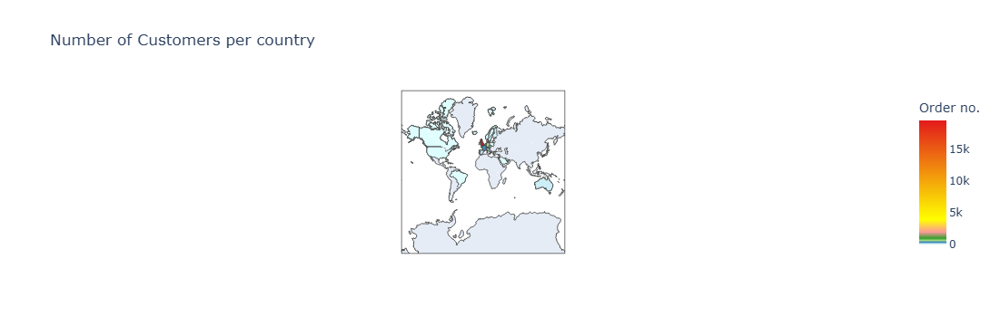

In [42]:
layout = dict(title='Number of Customers per country',
              geo = dict(showframe = True, projection={'type':'mercator'}))

choromap = go.Figure(data = [data], layout = layout)
iplot(choromap, validate=False)

 we can see that there are total of 22190 customers from different countries with most of them are from  
United Knigdom with 19857 customers

Germany with 603 custome


France with 458 custo
rs

EIRE with 319 cus
mers

Belgium with 119 c
Spain with 105 customers

Netherlands 10 customers1ustomers

#Most of the customers are segmented in one country , the company can use marketing strategy focused in United Kingdom

In [43]:
df['Total_Amount'] = df['Quantity']*df['UnitPrice']

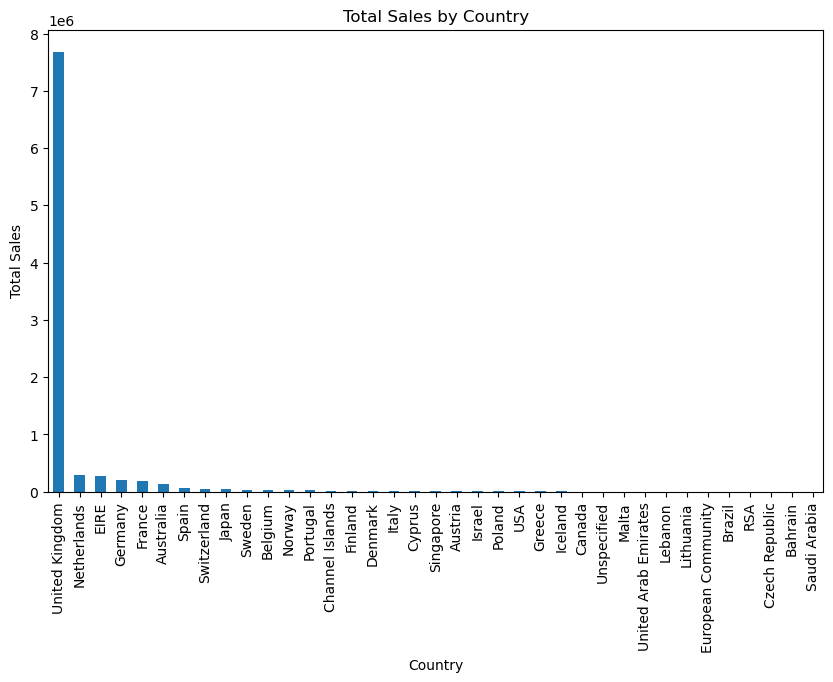

In [44]:
sales_by_country = df.groupby('Country')['Total_Amount'].sum().sort_values(ascending=False)
sales_by_country.plot(kind='bar', figsize=(10,6))
plt.title('Total Sales by Country')
plt.xlabel('Country')
plt.ylabel('Total Sales')
plt.show()

Given that a substantial portion (89%) of transactions are originating from the United Kingdom, we might consider creating a binary feature indicating whether the transaction is from the UK or not in feature engineering.
This approach can potentially streamline the clustering process without losing critical geographical information, especially when considering the application of algorithms like K-means which are sensitive to the dimensionality of the feature space.

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399573 entries, 0 to 399572
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   InvoiceNo     399573 non-null  object        
 1   StockCode     399573 non-null  object        
 2   Description   399573 non-null  object        
 3   Quantity      399573 non-null  int64         
 4   InvoiceDate   399573 non-null  datetime64[ns]
 5   UnitPrice     399573 non-null  float64       
 6   CustomerID    399573 non-null  float64       
 7   Country       399573 non-null  object        
 8   Is_Return     399573 non-null  bool          
 9   Total_Amount  399573 non-null  float64       
dtypes: bool(1), datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 27.8+ MB


Lets try to segment customers based on psychographic Segmentation
Based on psychological and lifestyle factors, such as values, interests, attitudes, and lifestyle.



In [46]:
df['Description']

0          WHITE HANGING HEART T-LIGHT HOLDER
1                         WHITE METAL LANTERN
2              CREAM CUPID HEARTS COAT HANGER
3         KNITTED UNION FLAG HOT WATER BOTTLE
4              RED WOOLLY HOTTIE WHITE HEART.
                         ...                 
399568            PACK OF 20 SPACEBOY NAPKINS
399569           CHILDREN'S APRON DOLLY GIRL 
399570          CHILDRENS CUTLERY DOLLY GIRL 
399571        CHILDRENS CUTLERY CIRCUS PARADE
399572          BAKING SET 9 PIECE RETROSPOT 
Name: Description, Length: 399573, dtype: object

We are using NLP-Natural language processing method to for catergorizing products 

following these steps:

Remove punctuation from the Description column.
Convert text to lowercase.
Remove stop words.
Find the most frequently used words.

In [47]:
#lets replace the punctuations and numbers with " " in product description
# Ensure all non-alphabet characters are removed and regex parameter is set explicitly
df['Description_NLP'] = df['Description'].str.replace(r"[^a-zA-Z\s]", " ", regex=True).str.lower()

Removing stop Words


In [48]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk import word_tokenize

stop_words = set(stopwords.words('english'))

def remove_stopwords(text):
    tokens = word_tokenize(text)
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return " ".join(filtered_tokens)
    
df['Description_NLP'] = df['Description_NLP'].apply(remove_stopwords)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jvenk\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jvenk\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [49]:
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [50]:
df['Description_NLP']

0            white hanging heart light holder
1                         white metal lantern
2              cream cupid hearts coat hanger
3         knitted union flag hot water bottle
4               red woolly hottie white heart
                         ...                 
399568                  pack spaceboy napkins
399569              children apron dolly girl
399570           childrens cutlery dolly girl
399571        childrens cutlery circus parade
399572             baking set piece retrospot
Name: Description_NLP, Length: 399573, dtype: object

Dropping the duplicates


In [51]:
df2 = df['Description_NLP'].drop_duplicates()
df2 = pd.DataFrame(df2)
df2

,Description_NLP
0,white hanging heart light holder
1,white metal lantern
2,cream cupid hearts coat hanger
3,knitted union flag hot water bottle
4,red woolly hottie white heart
...,...
390600,letter w bling key ring
390602,letter z bling key ring
392415,pink crystal skull phone charm
396983,cream hanging heart light holder



4,06,829 rows got reduced to 3876 rows after dropping the duplicates
That means there are only3870 unique products are thres

Finding the most frequent words from the product Description


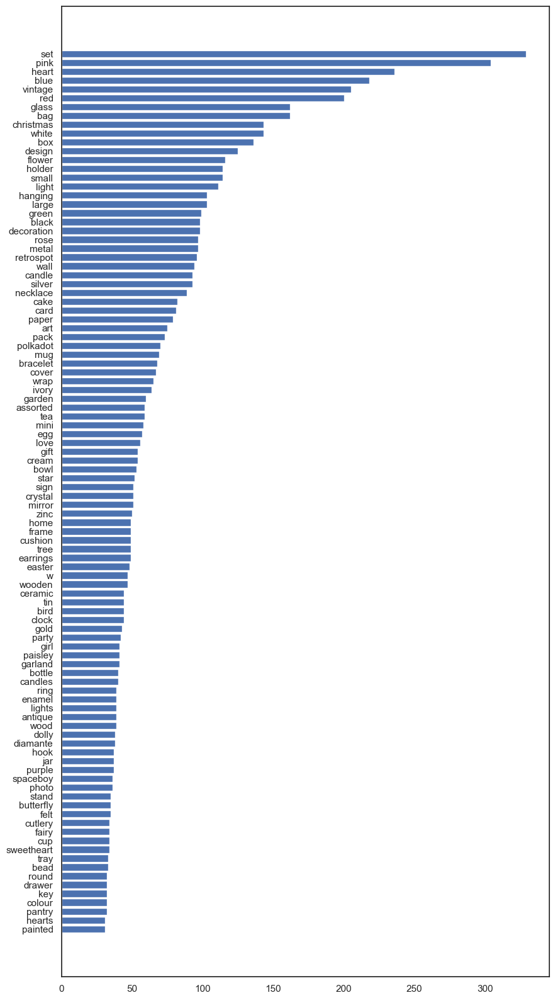

In [52]:
sns.set(style = 'white')
from nltk import FreqDist # function to find the frequent words in the data


# Extracts words into list and count frequency
all_words = ' '.join([text for text in df2['Description_NLP']])  # all the rows are joined into a single paragraph
all_words = all_words.split()
words_df = FreqDist(all_words)

# Extracting words and frequency from words_df object
words_df = pd.DataFrame({'word':list(words_df.keys()), 'count':list(words_df.values())})
words_df

# Subsets top 100 words by frequency
words_df = words_df.nlargest(columns="count", n = 100) 
words_df.sort_values('count', inplace = True)

# Plotting 100 frequent words
plt.figure(figsize=(10,20))
ax = plt.barh(words_df['word'], width = words_df['count'])
plt.show()

In [53]:
pip install wordcloud


Note: you may need to restart the kernel to use updated packages.


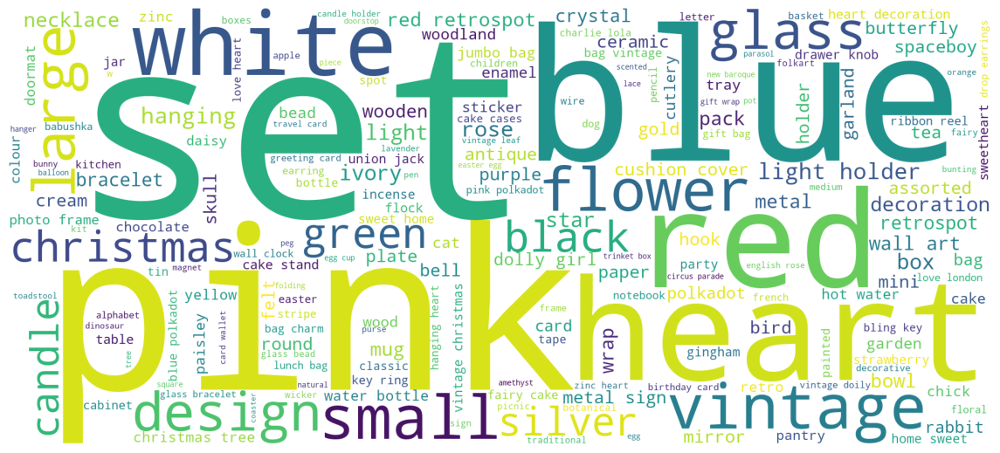

In [54]:
from wordcloud import WordCloud

all_words = ' '.join([text for text in df2['Description_NLP']])
 
wordcloud = WordCloud(width = 1800, height = 800, 
                      background_color ='white', 
                      min_font_size = 10).generate(all_words)

#plot the WordCloud image                        
plt.figure(figsize = (13,5), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()
     


In [55]:
for value in df['Description_NLP']:
    print(value)


white hanging heart light holder
white metal lantern
cream cupid hearts coat hanger
knitted union flag hot water bottle
red woolly hottie white heart
set babushka nesting boxes
glass star frosted light holder
hand warmer union jack
hand warmer red polka dot
assorted colour bird ornament
poppy playhouse bedroom
poppy playhouse kitchen
feltcraft princess charlotte doll
ivory knitted mug cosy
box assorted colour teaspoons
box vintage jigsaw blocks
box vintage alphabet blocks
home building block word
love building block word
recipe box metal heart
doormat new england
jam making set jars
red coat rack paris fashion
yellow coat rack paris fashion
blue coat rack paris fashion
bath building block word
alarm clock bakelike pink
alarm clock bakelike red
alarm clock bakelike green
panda bunnies sticker sheet
stars gift tape
inflatable political globe
vintage heads tails card game
set red retrospot tea towels
round snack boxes set woodland
spaceboy lunch box
lunch box love london
circus parade lun

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




watering green dinosaur
doughnut lip gloss
homemade jam scented candles
rose wick morris boxed candle
chocolate wick morris box candle
rose scent candle jewelled drawer
gardenia wick morris boxed candle
coloured party balloons
rose scent candle jewelled box
set vanilla scented candle box
set ocean scent candle jewel box
fruit tree birds wall plaque
strawberry bath sponge
apple bath sponge
wooden skittles garden set
feltcraft boy jean paul kit
paper bunting white lace
skulls party bag sticker set
retrospot party bag sticker set
dinosaur party bag sticker set
woodland party bag sticker set
bingo set
watering blue elephant
pack traditional crayons
set soldier skittles
poppy playhouse bedroom
childs garden trowel pink
watering pink bunny
childs garden brush blue
brocante shelf hooks
classic metal birdcage plant holder
childs garden trowel pink
childs garden spade pink
childs garden rake pink
teatime fairy cake cases
enamel bread bin cream
childs garden brush pink
childs garden fork pink
p

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




mini playing cards fun fair
set mini grocery magnets
feltcraft princess charlotte doll
feltcraft princess lola doll
feltcraft princess olivia doll
set ivory polkadot party candles
set blue polkadot party candles
set red polkadot party candles
vintage snap cards
coloured party balloons
blue harmonica box
set hanging owls ollie beak
brocade ring purse
vintage donkey tail game
bingo set
lunch bag black skull
pantry washing brush
glass apothecary bottle tonic
pantry chopping board
pack traditional crayons
baking set piece retrospot
vintage snap cards
hello sailor blue soap holder
wood drawer cabinet white finish
wall art alphabet
classic glass cookie jar
alarm clock bakelike pink
alarm clock bakelike red
gumball coat rack
regency cakestand tier
aged glass silver light holder
small glass heart trinket pot
pear botanical dinner candles
lavender botanical dinner candles
vanilla botanical candles
set rose botanical candles
black christmas tree cm
black christmas tree cm
magnets pack retro pho

In [56]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Is_Return,Total_Amount,Description_NLP
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,False,15.30,white hanging heart light holder
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False,20.34,white metal lantern
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,False,22.00,cream cupid hearts coat hanger
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False,20.34,knitted union flag hot water bottle
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,False,20.34,red woolly hottie white heart


By looking at the products list we can see that the The company mainly sells unique all-occasion gifts,we cannot segment the customers based on the single category products.  ( http://archive.ics.uci.edu/dataset/352/online+retail )

FEATURE ENGINEERING

RFM is a method used for analyzing customer value and segmenting the customer base. It is an acronym that stands for:

Recency (R): This metric indicates how recently a customer has made a purchase. A lower recency value means the customer has purchased more recently, indicating higher engagement with the brand.
Frequency (F): This metric signifies how often a customer makes a purchase within a certain period. A higher frequency value indicates a customer who interacts with the business more often, suggesting higher loyalty or satisfaction.
Monetary (M): This metric represents the total amount of money a customer has spent over a certain period. Customers who have a higher monetary value have contributed more to the business, indicating their potential high lifetime value.
Together, these metrics help in understanding a customer's buying behavior and preferences, which is pivotal in personalizing marketing strategies and creating a recommendation system.

In this step, we focus on understanding how recently a customer has made a purchase.
This is a crucial aspect of customer segmentation as it helps in identifying the engagement level of customers. 
Here, I am going to define the following feature:

Days Since Last Purchas: This feature represents the number of days that have passed since the customer's last purchase.
A lower value indicates that the customer has purchased recently, implying a higher engagement level with the business, whereas a higher value may indicate a lapse or decreased engagement. 
By understanding the recency of purchases, businesses can tailor their marketing strategies to re-engage customers who have not made purchases in a while, potentially increasing customer retention and fostering loyalty.

In [57]:
# RFM Analysis
#RECENCY

# Convert InvoiceDate to datetime and extract only the date
df['InvoiceDay'] = df['InvoiceDate'].dt.date

# Find the most recent purchase date for each customer
customer_data = df.groupby('CustomerID')['InvoiceDay'].max().reset_index()

# Find the most recent date in the entire dataset
most_recent_date = df['InvoiceDay'].max()

# Convert InvoiceDay to datetime type before subtraction
customer_data['InvoiceDay'] = pd.to_datetime(customer_data['InvoiceDay'])
most_recent_date = pd.to_datetime(most_recent_date)

# Calculate the number of days since the last purchase for each customer
customer_data['Days_Since_Last_Purchase'] = (most_recent_date - customer_data['InvoiceDay']).dt.days

# Remove the InvoiceDay column
customer_data.drop(columns=['InvoiceDay'], inplace=True)


In [58]:
#we have created a new dataframe for the feature engineering 
customer_data.head()

,CustomerID,Days_Since_Last_Purchase
0,12346.0,325
1,12347.0,2
2,12348.0,75
3,12349.0,18
4,12350.0,310


In [59]:
customer_data.shape


(4362, 2)

#Frequency
I am going to create two features that quantify the frequency of a customer's engagement with the retailer:

Total Transactions: This feature represents the total number of transactions made by a customer. It helps in understanding the engagement level of a customer with the retailer.
Total Products Purchased: This feature indicates the total number of products (sum of quantities) purchased by a customer across all transactions. It gives an insight into the customer's buying behavior in terms of the volume of products purchased.
These features will be crucial in segmenting customers based on their buying frequency, which is a key aspect in determining customer segments for targeted marketing and personalized recommendations.

In [60]:
#frequency
# Calculate the total number of transactions made by each customer
total_transactions = df.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()
total_transactions.rename(columns={'InvoiceNo': 'Total_Transactions'}, inplace=True)

# Calculate the total number of products purchased by each customer
total_products_purchased = df.groupby('CustomerID')['Quantity'].sum().reset_index()
total_products_purchased.rename(columns={'Quantity': 'Total_Products_Purchased'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, total_transactions, on='CustomerID')
customer_data = pd.merge(customer_data, total_products_purchased, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased
0,12346.0,325,2,148430
1,12347.0,2,7,2458
2,12348.0,75,4,2332
3,12349.0,18,1,630
4,12350.0,310,1,196


In [61]:
# MONETARY

 I am going to create two features that represent the monetary aspect of customer's transactions:

Total Spend: This feature represents the total amount of money spent by each customer. It is calculated as the sum of the product of UnitPrice and Quantity for all transactions made by a customer. This feature is crucial as it helps in identifying the total revenue generated by each customer, which is a direct indicator of a customer's value to the business.
Average Transaction Value: This feature is calculated as the Total Spend divided by the Total Transactions for each customer. It indicates the average value of a transaction carried out by a customer. This metric is useful in understanding the spending behavior of customers per transaction, which can assist in tailoring marketing strategies and offers to different customer segments based on their average spending patterns.

In [62]:
# Calculate the total spend by each customer
df['Total_Spend'] = df['UnitPrice'] * df['Quantity']
total_spend = df.groupby('CustomerID')['Total_Spend'].sum().reset_index()

# Calculate the average transaction value for each customer
average_transaction_value = total_spend.merge(total_transactions, on='CustomerID')
average_transaction_value['Average_Transaction_Value'] = average_transaction_value['Total_Spend'] / average_transaction_value['Total_Transactions']

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, total_spend, on='CustomerID')
customer_data = pd.merge(customer_data, average_transaction_value[['CustomerID', 'Average_Transaction_Value']], on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value
0,12346.0,325,2,148430,154367.20,77183.600000
1,12347.0,2,7,2458,4310.00,615.714286
2,12348.0,75,4,2332,1437.24,359.310000
3,12349.0,18,1,630,1457.55,1457.550000
4,12350.0,310,1,196,294.40,294.400000


In [63]:
customer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4362 entries, 0 to 4361
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 4362 non-null   float64
 1   Days_Since_Last_Purchase   4362 non-null   int64  
 2   Total_Transactions         4362 non-null   int64  
 3   Total_Products_Purchased   4362 non-null   int64  
 4   Total_Spend                4362 non-null   float64
 5   Average_Transaction_Value  4362 non-null   float64
dtypes: float64(3), int64(3)
memory usage: 204.6 KB


In [64]:
#featureing the product diversity in the customer buying behaviour
# Calculate the number of unique products purchased by each customer
unique_products_purchased = df.groupby('CustomerID')['StockCode'].nunique().reset_index()
unique_products_purchased.rename(columns={'StockCode': 'Unique_Products_Purchased'}, inplace=True)

# Merge the new feature into the customer_data dataframe
customer_data = pd.merge(customer_data, unique_products_purchased, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased
0,12346.0,325,2,148430,154367.20,77183.600000,1
1,12347.0,2,7,2458,4310.00,615.714286,103
2,12348.0,75,4,2332,1437.24,359.310000,21
3,12349.0,18,1,630,1457.55,1457.550000,72
4,12350.0,310,1,196,294.40,294.400000,16


In [65]:

# Count the number of orders per customer
order_counts = df['CustomerID'].value_counts()
order_counts.shape

# Find the number of customers with only one order
single_order_customers = order_counts[order_counts == 1]
num_single_order_customers = len(single_order_customers)
print(f"Number of customers with only one order: {num_single_order_customers}")


Number of customers with only one order: 80


In [66]:
#featureing how ofter the customer place the order , the time interval between the orders placed
# Calculate the average number of days between consecutive purchases
# Calculate the days between purchases

# Calculate the average number of days between consecutive purchases
days_between_purchases = df.groupby('CustomerID')['InvoiceDay'].apply(lambda x: (x.diff().dropna()).apply(lambda y: y.days))
average_days_between_purchases = days_between_purchases.groupby('CustomerID').mean().reset_index()
average_days_between_purchases.rename(columns={'InvoiceDay': 'Average_Days_Between_Purchases'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, average_days_between_purchases, on='CustomerID')

# Display the first few rows of the customer_data dataframe
customer_data.head()

C:\Users\jvenk\AppData\Local\Temp\ipykernel_24580\945748237.py:6: FutureWarning:

The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.



,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases
0,12346.0,325,2,148430,154367.20,77183.600000,1,0.000000
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000
4,12350.0,310,1,196,294.40,294.400000,16,0.000000


the 0 in the average days between purchase is the customers with only one single order, there are 77 customers with single transaction

Featuring the location of the customer , with most of the customers from the united kingdom
we will introduce a geographic feature that reflects the geographical location of customers. Understanding the geographic distribution of customers is pivotal 

In [67]:
# Group by CustomerID and Country to get the number of transactions per country for each customer
customer_country = df.groupby(['CustomerID', 'Country']).size().reset_index(name='Number_of_Transactions')

# Get the country with the maximum number of transactions for each customer (in case a customer has transactions from multiple countries)
customer_main_country = customer_country.sort_values('Number_of_Transactions', ascending=False).drop_duplicates('CustomerID')

# Create a binary column indicating whether the customer is from the UK or not
customer_main_country['From_UK'] = customer_main_country['Country'].apply(lambda x: 1 if x == 'United Kingdom' else 0)

# Merge this data with our customer_data dataframe
customer_data = pd.merge(customer_data, customer_main_country[['CustomerID', 'From_UK']], on='CustomerID', how='left')

# Display the first few rows of the customer_data dataframe
customer_data.head()


,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,From_UK
0,12346.0,325,2,148430,154367.20,77183.600000,1,0.000000,1
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575,0
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615,0
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000,0
4,12350.0,310,1,196,294.40,294.400000,16,0.000000,0


In [68]:
# Display feature distribution
customer_data['From_UK'].value_counts()

From_UK
1    3866
0     416
Name: count, dtype: int64

I will delve into the seasonality and trends in customers' purchasing behaviors, which can offer invaluable insights for tailoring marketing strategies and enhancing customer satisfaction. Here are the features I am looking to introduce:

Monthly_Spending_Mean: This is the average amount a customer spends monthly. It helps us gauge the general spending habit of each customer. A higher mean indicates a customer who spends more, potentially showing interest in premium products, whereas a lower mean might indicate a more budget-conscious customer.
Monthly_Spending_Std: This feature indicates the variability in a customer's monthly spending. A higher value signals that the customer's spending fluctuates significantly month-to-month, perhaps indicating sporadic large purchases. In contrast, a lower value suggests more stable, consistent spending habits. Understanding this variability can help in crafting personalized promotions or discounts during periods they are expected to spend more.
Spending_Trend: This reflects the trend in a customer's spending over time, calculated as the slope of the linear trend line fitted to their spending data. A positive value indicates an increasing trend in spending, possibly pointing to growing loyalty or satisfaction.

In [69]:

from scipy.stats import linregress

# Extract month and year from InvoiceDate
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month

# Calculate monthly spending for each customer
monthly_spending = df.groupby(['CustomerID', 'Year', 'Month'])['Total_Spend'].sum().reset_index()

# Calculate Seasonal Buying Patterns: We are using monthly frequency as a proxy for seasonal buying patterns
seasonal_buying_patterns = monthly_spending.groupby('CustomerID')['Total_Spend'].agg(['mean', 'std']).reset_index()
seasonal_buying_patterns.rename(columns={'mean': 'Monthly_Spending_Mean', 'std': 'Monthly_Spending_Std'}, inplace=True)

# Replace NaN values in Monthly_Spending_Std with 0, implying no variability for customers with a single transaction month
seasonal_buying_patterns['Monthly_Spending_Std'] = seasonal_buying_patterns['Monthly_Spending_Std'].fillna(0)

# Calculate Trends in Spending 
# Define function to calculate the trend (slope) using linear regression
def calculate_trend(spend_data):
    if len(spend_data) > 1:
        x = np.arange(len(spend_data))
        slope, _, _, _, _ = linregress(x, spend_data)
        return slope
    else:
        return 0  # Return 0 if only one data point is present

# Apply the calculate_trend function to find the spending trend for each customer
spending_trends = monthly_spending.groupby('CustomerID')['Total_Spend'].apply(calculate_trend).reset_index()
spending_trends.rename(columns={'Total_Spend': 'Spending_Trend'}, inplace=True)

# Merge the new features into the customer_data dataframe
customer_data = pd.merge(customer_data, seasonal_buying_patterns, on='CustomerID', how='left')
customer_data = pd.merge(customer_data, spending_trends, on='CustomerID', how='left')


In [70]:
# Display the first few rows of the customer_data dataframe
customer_data.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,From_UK,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12346.0,325,2,148430,154367.20,77183.600000,1,0.000000,1,154367.200000,0.000000,0.000000
1,12347.0,2,7,2458,4310.00,615.714286,103,2.016575,0,615.714286,341.070789,4.486071
2,12348.0,75,4,2332,1437.24,359.310000,21,10.884615,0,359.310000,203.875689,-100.884000
3,12349.0,18,1,630,1457.55,1457.550000,72,0.000000,0,1457.550000,0.000000,0.000000
4,12350.0,310,1,196,294.40,294.400000,16,0.000000,0,294.400000,0.000000,0.000000


In [71]:
# Changing the data type of 'CustomerID' to string as it is a unique identifier and not used in mathematical operations
customer_data['CustomerID'] = customer_data['CustomerID'].astype(str)

# Convert data types of columns to optimal types
customer_data = customer_data.convert_dtypes()

In [72]:
customer_data.head(10)

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,From_UK,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12346.0,325,2,148430,154367.2,77183.6,1,0.0,1,154367.2,0.0,0.0
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,0,615.714286,341.070789,4.486071
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,0,359.31,203.875689,-100.884
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,1457.55,0.0,0.0
4,12350.0,310,1,196,294.4,294.4,16,0.0,0,294.4,0.0,0.0
5,12352.0,36,8,589,1506.07,188.25875,57,3.13253,0,376.5175,133.84929,-14.715
6,12353.0,204,1,20,89.0,89.0,4,0.0,0,89.0,0.0,0.0
7,12354.0,232,1,530,1079.4,1079.4,58,0.0,0,1079.4,0.0,0.0
8,12355.0,214,1,240,459.4,459.4,13,0.0,0,459.4,0.0,0.0
9,12356.0,22,3,1573,2487.43,829.143333,52,5.315789,0,829.143333,991.462585,-944.635


In [73]:
customer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4282 entries, 0 to 4281
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CustomerID                      4282 non-null   string 
 1   Days_Since_Last_Purchase        4282 non-null   Int64  
 2   Total_Transactions              4282 non-null   Int64  
 3   Total_Products_Purchased        4282 non-null   Int64  
 4   Total_Spend                     4282 non-null   Float64
 5   Average_Transaction_Value       4282 non-null   Float64
 6   Unique_Products_Purchased       4282 non-null   Int64  
 7   Average_Days_Between_Purchases  4282 non-null   Float64
 8   From_UK                         4282 non-null   Int64  
 9   Monthly_Spending_Mean           4282 non-null   Float64
 10  Monthly_Spending_Std            4282 non-null   Float64
 11  Spending_Trend                  4282 non-null   Float64
dtypes: Float64(6), Int64(5), string(1)

we are done with the feature engineering,We have created a dataset that focuses on our customers, using a variety of new features that give us a deeper understanding of their buying patterns and preferences. 

lets look at our data more closely to find any patterns or trends, making sure our data is in the best shape by checking for and handling any outliers, and preparing our data for the clustering process. 

CHECKING FOR OUTLIERS

In [74]:
from sklearn.ensemble import IsolationForest

# Initialize the IsolationForest model with contamination of 0.05
model = IsolationForest(contamination=0.05, random_state=0)

# Fit the model and add a column for outlier scores directly
customer_data['Outlier_Scores'] = model.fit_predict(customer_data.iloc[:, 1:].to_numpy())

# Creating a new column to identify outliers (1 for inliers and -1 for outliers)
customer_data['Is_Outlier'] = [1 if x == -1 else 0 for x in customer_data['Outlier_Scores']]

# Display the first few rows of the updated DataFrame
customer_data.head()


,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,From_UK,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,Outlier_Scores,Is_Outlier
0,12346.0,325,2,148430,154367.2,77183.6,1,0.0,1,154367.2,0.0,0.0,-1,1
1,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,0,615.714286,341.070789,4.486071,1,0
2,12348.0,75,4,2332,1437.24,359.31,21,10.884615,0,359.31,203.875689,-100.884,1,0
3,12349.0,18,1,630,1457.55,1457.55,72,0.0,0,1457.55,0.0,0.0,-1,1
4,12350.0,310,1,196,294.4,294.4,16,0.0,0,294.4,0.0,0.0,1,0


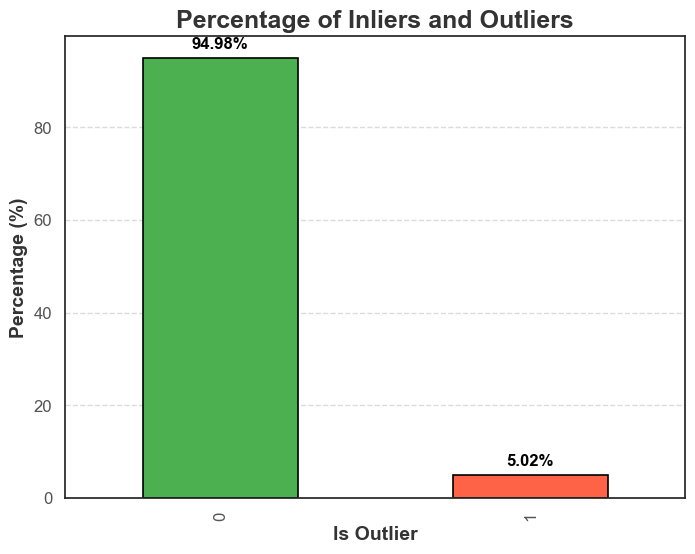

In [75]:

# Calculate the percentage of inliers and outliers 
outlier_percentage = customer_data['Is_Outlier'].value_counts(normalize=True) * 100

# Plotting the percentage of inliers and outliers as a vertical bar graph
plt.figure(figsize=(8, 6))

# Using a different color palette and adding more visual style
outlier_percentage.plot(kind='bar', color=['#4CAF50', '#FF6347'], edgecolor='black', linewidth=1.2)

# Adding the percentage labels on the bars
for index, value in enumerate(outlier_percentage):
    plt.text(index, value + 2, f'{value:.2f}%', fontsize=12, color='black', fontweight='bold', ha='center')

# Enhancing plot aesthetics
plt.title('Percentage of Inliers and Outliers', fontsize=18, fontweight='bold', color='#333333')
plt.xticks(ticks=np.arange(len(outlier_percentage)), labels=outlier_percentage.index, fontsize=12, color='#555555')
plt.yticks(fontsize=12, color='#555555')
plt.ylabel('Percentage (%)', fontsize=14, fontweight='bold', color='#333333')
plt.xlabel('Is Outlier', fontsize=14, fontweight='bold', color='#333333')

# Display gridlines for better visual separation
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()



Considering the nature of the project (customer segmentation using clustering), it is crucial to handle these outliers to prevent them from affecting the clusters' quality significantly. Therefore, I will separate these outliers for further analysis and remove them from our main dataset to prepare it for the clustering analysis.

Let's proceed with the following steps:

Separate the identified outliers for further analysis and save them as a separate file (optional).
Remove the outliers from the main dataset to prevent them from influencing the clustering process.
Drop the Outlier_Scores and Is_Outlier columns as they were auxiliary columns used for the outlier detection process.

In [76]:
#dealing with outliers
# Separate the outliers for analysis
outliers_data = customer_data[customer_data['Is_Outlier'] == 1]

# Remove the outliers from the main dataset
customer_data_cleaned = customer_data[customer_data['Is_Outlier'] == 0]

# Drop the 'Outlier_Scores' and 'Is_Outlier' columns
customer_data_cleaned = customer_data_cleaned.drop(columns=['Outlier_Scores', 'Is_Outlier'])

# Reset the index of the cleaned data
customer_data_cleaned.reset_index(drop=True, inplace=True)


In [77]:
# Getting the number of rows in the cleaned customer dataset
customer_data_cleaned.shape[0]

4067

CORRELATION ANALYSIS

Before we proceed to KMeans clustering, it's essential to check the correlation between features in our dataset. The presence of multicollinearity, where features are highly correlated, can potentially affect the clustering process by not allowing the model to learn the actual underlying patterns in the data, as the features do not provide unique information. This could lead to clusters that are not well-separated and meaningful.

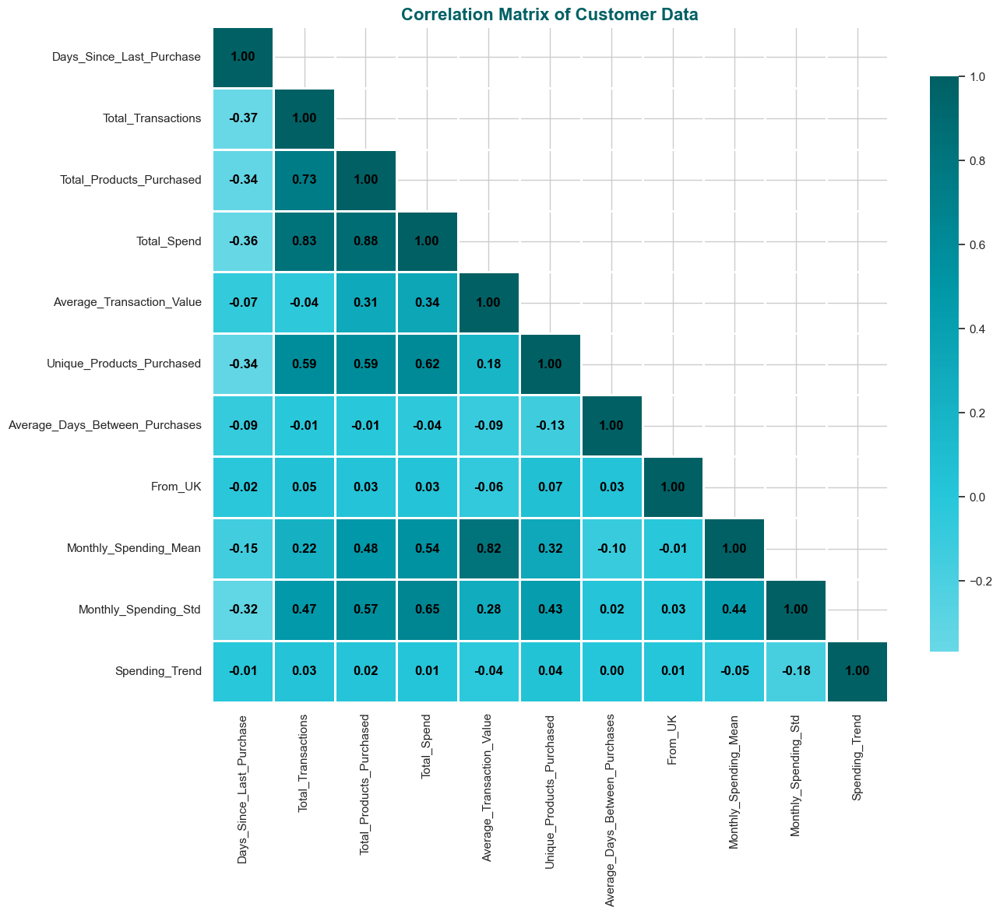

In [78]:
from matplotlib.colors import LinearSegmentedColormap  

# Reset background style to 'whitegrid' for better readability
sns.set_style('whitegrid')

# Calculate the correlation matrix excluding the 'CustomerID' column
corr = customer_data_cleaned.drop(columns=['CustomerID']).corr()

# Define a custom colormap with a smooth gradient of colors
# Using shades of blue to create a cool color map (alternatively, you can experiment with other schemes like 'coolwarm')
colors = ['#E0F7FA', '#80DEEA', '#26C6DA', '#0097A7', '#006064']
my_cmap = LinearSegmentedColormap.from_list('cool_gradient', colors, N=256)

# Create a mask to only show the lower triangle of the matrix (since it's mirrored)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True

# Plot the heatmap
plt.figure(figsize=(14, 12))  # Increased size for better readability

# Plot with custom colormap, annotated values, and no grid lines for clarity
sns.heatmap(corr, mask=mask, cmap=my_cmap, annot=True, center=0, fmt='.2f', 
            linewidths=1, cbar_kws={'shrink': 0.8}, square=True, 
            annot_kws={'size': 12, 'weight': 'bold', 'color': 'black'})

# Title styling for better emphasis
plt.title('Correlation Matrix of Customer Data', fontsize=16, weight='bold', color='#006064', loc='center')

# Show the plot
plt.show()

Looking at the heatmap, we can see that there are some pairs of variables that have high correlations, for instance:
Total_Transactions and Total_Spend, Total_Spend and Total_Products_Purchased, Monthly_Spending_Mean and Average_Transaction_Value, Total_Transactions and Total_Products_Purchased.
These high correlations indicate that these variables move closely together, implying a degree of multicollinearity.


Before we move forward with the clustering and dimensionality reduction, it's imperative to scale our features.
This step holds significant importance, especially in the context of distance-based algorithms like K-means and dimensionality reduction methods like PCA. 

In [79]:
#to ensure a balanced influence on the model and to reveal the true patterns in the data, I am going to standardize our data, meaning transforming the features to have a mean of 0 and a standard deviation of 1. However, not all features require scaling. Here are the exceptions and the reasons why they are excluded:

#CustomerID: This feature is just an identifier for the customers and does not contain any meaningful information for clustering.
#Is_UK: This is a binary feature indicating whether the customer is from the UK or not. Since it already takes a value of 0 or 1, scaling it won't make any significant difference.

In [80]:
# Initialize the StandardScaler
scaler = StandardScaler()

# List of columns that don't need to be scaled
columns_to_exclude = ['CustomerID', 'From_UK']

# List of columns that need to be scaled
columns_to_scale = customer_data_cleaned.columns.difference(columns_to_exclude)

# Copy the cleaned dataset
customer_data_scaled = customer_data_cleaned.copy()

# Applying the scaler to the necessary columns in the dataset
customer_data_scaled[columns_to_scale] = scaler.fit_transform(customer_data_scaled[columns_to_scale])

# Display the first few rows of the scaled data
customer_data_scaled.head()


,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,From_UK,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,12347.0,-0.895634,0.596735,1.886031,2.163442,1.630614,0.742155,-0.124702,0,0.930669,1.277406,0.124473
1,12348.0,-0.159936,-0.045364,1.750232,0.179630,0.353767,-0.561445,0.644077,0,-0.015669,0.475864,-0.520613
2,12350.0,2.208409,-0.687464,-0.551891,-0.609570,0.030527,-0.640933,-0.299521,0,-0.255240,-0.715250,0.097009
3,12352.0,-0.552980,0.810769,-0.128326,0.227161,-0.498037,0.010867,-0.027959,0,0.047840,0.066745,0.006922
4,12353.0,1.140134,-0.687464,-0.741579,-0.751411,-0.992328,-0.831704,-0.299521,0,-1.013331,-0.715250,0.097009


In [81]:
customer_data_scaled.shape

(4067, 12)

Dimensionality Reduction

PCA is an excellent starting point because it works well in capturing linear relationships in the data, which is particularly relevant given the multicollinearity we identified in our dataset. It allows us to reduce the number of features in our dataset while still retaining a significant amount of the information, thus making our clustering analysis potentially more accurate and interpretable. Moreover, it is computationally efficient, which means it won't significantly increase the processing time.

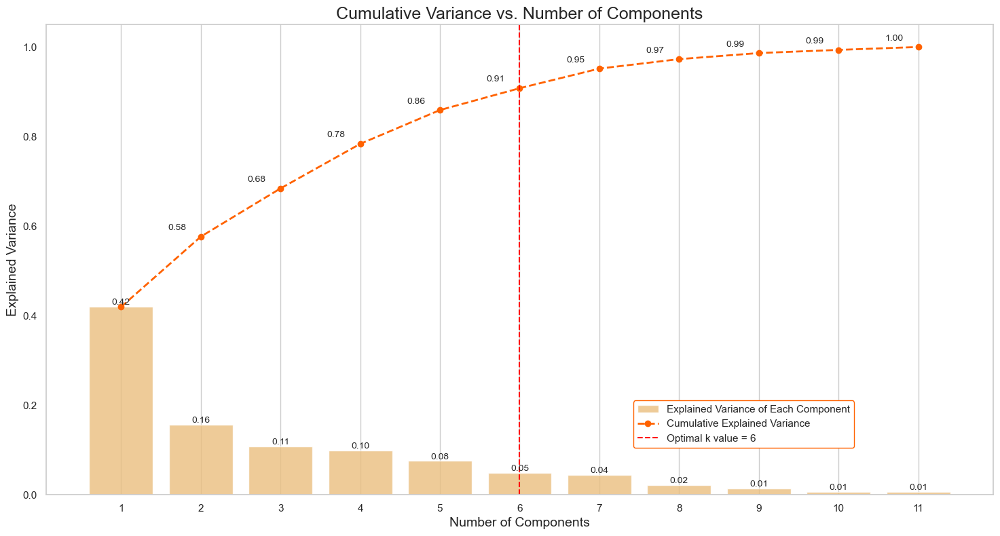

In [82]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Setting CustomerID as the index column
customer_data_scaled.set_index('CustomerID', inplace=True)

# Step 2: Apply PCA
pca = PCA()
pca.fit(customer_data_scaled)

# Step 3: Explained variance and cumulative explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value (based on your analysis)
optimal_k = 6

# Step 4: Set the seaborn plot style and background color
sns.set(style="whitegrid")  # Using a valid Seaborn style: 'whitegrid', 'darkgrid', 'ticks', or 'white'

# Define a unique colormap for the plot
colors = sns.color_palette("coolwarm", len(explained_variance_ratio))

# Create a larger figure for better visualization
plt.figure(figsize=(18, 9))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#fcc36d',
                      alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot optimal k value line
optimal_k_line = plt.axvline(optimal_k - 1, color='red', linestyle='--', label=f'Optimal k value = {optimal_k}') 

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, optimal_k_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Optimal k value = {optimal_k}'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,  
           edgecolor='#ff6200')  

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')   
plt.show()



From the plot, we can see that the increase in cumulative variance starts to slow down after the 7th component (which captures about 80% of the total variance).

Considering the context of customer segmentation, we want to retain a sufficient amount of information to identify distinct customer groups effectively. Therefore, retaining the first 7 components might be a balanced choice, as they together explain a substantial portion of the total variance while reducing the dimensionality of the dataset.

In [83]:
# Step 1: Perform clustering (e.g., KMeans or any clustering method)
from sklearn.cluster import KMeans

# Assuming you have some clustering model (e.g., KMeans) and you are clustering the scaled data
kmeans = KMeans(n_clusters=5)  # Adjust the number of clusters as needed
new_labels = kmeans.fit_predict(customer_data_scaled)  # This is where 'new_labels' comes from

# Step 2: Create PCA object with 6 components
pca = PCA(n_components=6)

# Step 3: Fit and transform the scaled data using PCA
customer_data_pca = pca.fit_transform(customer_data_scaled)

# Step 4: Create a pandas DataFrame from the PCA results with columns 'PC1', 'PC2', ..., 'PC6'
customer_data_pca = pd.DataFrame(customer_data_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Step 5: Add the 'CustomerID' index back to the PCA DataFrame (from the original dataset)
customer_data_pca.index = customer_data_scaled.index

# Step 6: Add the 'cluster' column based on your clustering results
customer_data_pca['cluster'] = new_labels

# Display the new PCA dataframe
print(customer_data_pca.head())


                 PC1       PC2       PC3       PC4       PC5       PC6  \
CustomerID                                                               
12347.0     3.618895  0.701233 -0.022725  0.397206 -0.073743 -0.371650   
12348.0     0.890746  0.086711  0.937568  0.295968  0.450073 -0.398692   
12350.0    -1.842267  0.915983 -0.612618 -0.414970  1.525312  0.111079   
12352.0     0.412231 -0.722131  0.035586 -0.083817 -0.275844 -0.165591   
12353.0    -2.280750 -0.351198 -0.359509 -0.493420  0.635077 -0.252028   

            cluster  
CustomerID           
12347.0           3  
12348.0           3  
12350.0           1  
12352.0           2  
12353.0           1  


In [84]:
#let's extract the coefficients corresponding to each principal component to better understand the transformation performed by PCA:

In [85]:
# Define a function to highlight the top 3 absolute values in each column of a dataframe
def highlight_top3(column):
    top3 = column.abs().nlargest(3).index
    return ['background-color:  #ffeacc' if i in top3 else '' for i in column.index]

# Assuming 'customer_data_scaled' is a NumPy array, and the original data has column names
#scaled_columns = customer_data.drop(columns=['CustomerID']).columns  # Get column names without 'CustomerID'

# Create the PCA component DataFrame with correct column names
pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],  
                     index=customer_data_scaled.columns)

# Apply the highlighting function to the PCA DataFrame
pc_df.style.apply(highlight_top3, axis=0)


,PC1,PC2,PC3,PC4,PC5,PC6
Days_Since_Last_Purchase,-0.230893,0.239407,-0.172777,-0.202880,0.884651,0.073491
Total_Transactions,0.379077,-0.375502,-0.068125,-0.090898,0.194857,0.016700
Total_Products_Purchased,0.432535,-0.093538,-0.040737,0.028917,0.205038,-0.012148
Total_Spend,0.458499,-0.078919,-0.044319,-0.005442,0.194843,-0.084116
Average_Transaction_Value,0.223339,0.650676,-0.012315,0.203947,-0.096463,0.138030
Unique_Products_Purchased,0.353074,-0.159339,-0.193706,-0.128040,-0.096288,0.672666
Average_Days_Between_Purchases,-0.029166,-0.184549,0.591600,0.686439,0.278651,0.239194
From_UK,0.004240,-0.016612,0.001573,-0.000828,0.005508,0.012142
Monthly_Spending_Mean,0.319565,0.534522,-0.006559,0.140202,-0.005683,0.038682
Monthly_Spending_Std,0.357620,0.019434,0.288308,-0.104840,0.050911,-0.624802


 K-Means Clustering

To ascertain the optimal number of clusters (k) for segmenting customers, I will explore two renowned methods:

Elbow Method

Silhouette Method

It's common to utilize both methods in practice to corroborate the results.

In [86]:
pip install yellowbrick


Note: you may need to restart the kernel to use updated packages.


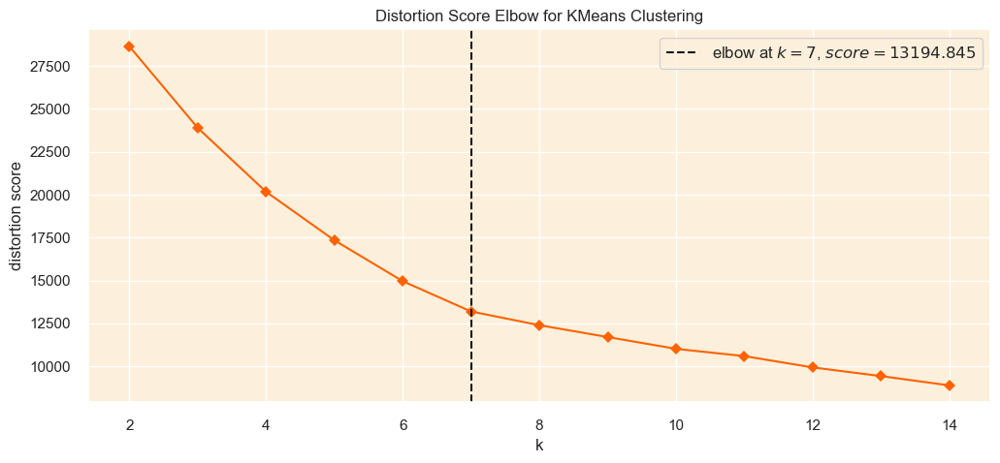

In [87]:
#ELBOW METHOD

from yellowbrick.cluster import KElbowVisualizer
# Set plot style, and background color
sns.set(style='darkgrid', rc={'axes.facecolor': '#fcf0dc'})

# Set the color palette for the plot
sns.set_palette(['#ff6200'])

# Instantiate the clustering model with the specified parameters
km = KMeans(init='k-means++', n_init=10, max_iter=100, random_state=0)

# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(12, 5))

# Instantiate the KElbowVisualizer with the model and range of k values, and disable the timing plot
visualizer = KElbowVisualizer(km, k=(2, 15), timings=False, ax=ax)

# Fit the data to the visualizer
visualizer.fit(customer_data_pca)

# Finalize and render the figure
visualizer.show();


Optimal k Value: Elbow Method Insights
The optimal value of k for the KMeans clustering algorithm can be found at the elbow point. Using the YellowBrick library for the Elbow method, we observe that the suggested optimal k value is 7. However, we don't have a very distinct elbow point in this case, which is common in real-world data. From the plot, we can see that the inertia continues to decrease significantly up to k=7, indicating that the optimum value of k could be between 4 and 8. To choose the best k within this range, we can employ the silhouette analysis, another cluster quality evaluation method. Additionally, incorporating business insights can help determine a practical k value.

 Silhouette Method

The Silhouette Method is an approach to find the optimal number of clusters in a dataset by evaluating the consistency within clusters and their separation from other clusters. It computes the silhouette coefficient for each data point, which measures how similar a point is to its own cluster compared to other clusters.

The silhouette score is the average silhouette coefficient calculated for all data points in a dataset. It provides an overall assessment of the clustering quality, taking into account both cohesion within clusters and separation between clusters. A higher silhouette score indicates a better clustering configuration.



In [88]:
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.cluster import KMeans

def silhouette_analysis(df, start_k, stop_k, figsize=(15, 16)):
    """
    Perform Silhouette analysis for a range of k values and visualize the results.
    """

    # Set the size of the figure
    plt.figure(figsize=figsize)
# Create a grid with (stop_k - start_k + 1) rows and 2 columns
    grid = gridspec.GridSpec(stop_k - start_k + 1, 2)

    # Assign the first plot to the first row and both columns
    first_plot = plt.subplot(grid[0, :])

    # First plot: Silhouette scores for different k values
    sns.set_palette(['darkorange'])

    silhouette_scores = []

    # Iterate through the range of k values
    for k in range(start_k, stop_k + 1):
        km = KMeans(n_clusters=k, init='k-means++', n_init=10, max_iter=100, random_state=42)
        km.fit(df)
        labels = km.predict(df)
        score = silhouette_score(df, labels)
        silhouette_scores.append(score)
    best_k = start_k + silhouette_scores.index(max(silhouette_scores))

    plt.plot(range(start_k, stop_k + 1), silhouette_scores, marker='o')
    plt.xticks(range(start_k, stop_k + 1))
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette score')
    plt.title('Average Silhouette Score for Different k Values', fontsize=15)

    # Add the optimal k value text to the plot
    optimal_k_text = f'The k value with the highest Silhouette score is: {best_k}'
    plt.text(10, 0.23, optimal_k_text, fontsize=12, verticalalignment='bottom', 
             horizontalalignment='left', bbox=dict(facecolor='#fcc36d', edgecolor='#ff6200', boxstyle='round, pad=0.5'))
   # Second plot (subplot): Silhouette plots for each k value
    colors = sns.color_palette("bright")

    for i in range(start_k, stop_k + 1):    
        km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
        row_idx, col_idx = divmod(i - start_k, 2)

        # Assign the plots to the second, third, and fourth rows
        ax = plt.subplot(grid[row_idx + 1, col_idx])

        visualizer = SilhouetteVisualizer(km, colors=colors, ax=ax)
        visualizer.fit(df)
 # Add the Silhouette score text to the plot
        score = silhouette_score(df, km.labels_)
        ax.text(0.97, 0.02, f'Silhouette Score: {score:.2f}', fontsize=12, \
                ha='right', transform=ax.transAxes, color='red')

        ax.set_title(f'Silhouette Plot for {i} Clusters', fontsize=15)

    plt.tight_layout()
    plt.show()

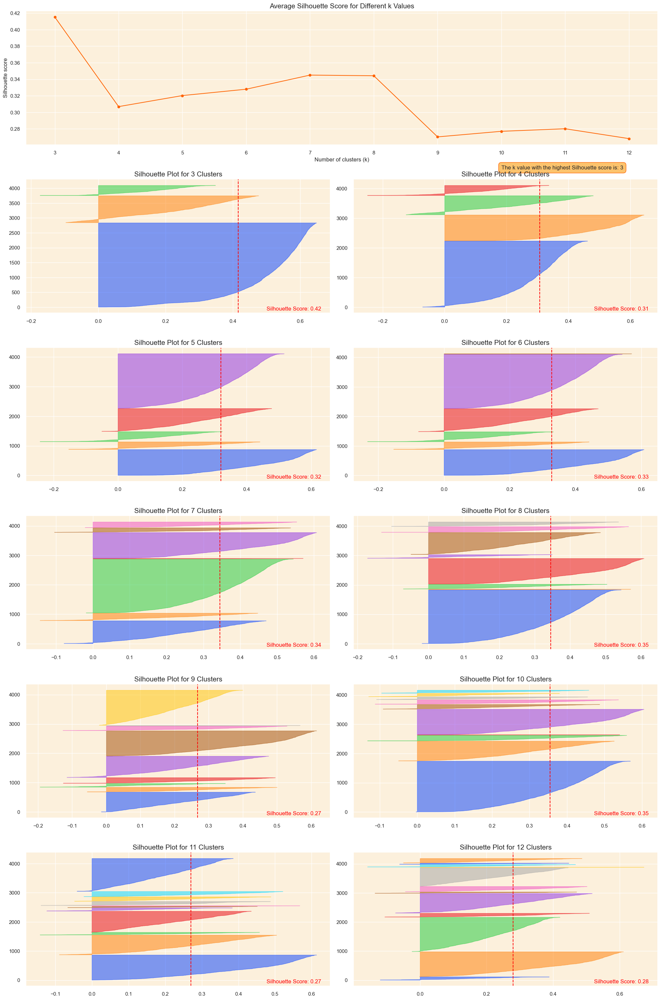

In [89]:
silhouette_analysis(customer_data_pca, 3, 12, figsize=(20, 50))

Wide Widths (closer to +1): Indicate that the data points in the cluster are well separated from points in other clusters, suggesting well-defined clusters.

Average Silhouette Score:

High Average Width: A cluster with a high average silhouette score indicates well-separated clusters.

optimal k Value: Silhouette Method Insights
Based on above guidelines and after carefully considering the silhouette plots, it's clear that choosing ( k = 3 ) is the better option. This choice gives us clusters that are more evenly matched and well-defined, making our clustering solution stronger and more reliabl

Clustering Model - K-means

 I am going to apply the K-means clustering algorithm to segment customers into different clusters based on their purchasing behaviors and other characteristics, using the optimal number of clusters determined in the previous step.

It's important to note that the K-means algorithm might assign different labels to the clusters in each run. To address this, we have taken an additional step to swap the labels based on the frequency of samples in each cluster, ensuring a consistent label assignment across different runs.

In [90]:
from collections import Counter
# Apply KMeans clustering using the optimal k
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=100, random_state=42)
kmeans.fit(customer_data_pca)

# Get the frequency of each cluster
cluster_frequencies = Counter(kmeans.labels_)

# Create a mapping from old labels to new labels based on frequency
label_mapping = {label: new_label for new_label, (label, _) in 
                 enumerate(cluster_frequencies.most_common())}

# Reverse the mapping to assign labels as per your criteria
label_mapping = {v: k for k, v in {2: 1, 1: 0, 0: 2}.items()}

# Apply the mapping to get the new labels
new_labels = np.array([label_mapping[label] for label in kmeans.labels_])

# Append the new cluster labels back to the original dataset
customer_data_cleaned['cluster'] = new_labels

# Append the new cluster labels to the PCA version of the dataset
customer_data_pca['cluster'] = new_labels

In [91]:
# Display the first few rows of the original dataframe
customer_data_cleaned.head()

,CustomerID,Days_Since_Last_Purchase,Total_Transactions,Total_Products_Purchased,Total_Spend,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,From_UK,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,cluster
0,12347.0,2,7,2458,4310.0,615.714286,103,2.016575,0,615.714286,341.070789,4.486071,1
1,12348.0,75,4,2332,1437.24,359.31,21,10.884615,0,359.31,203.875689,-100.884,1
2,12350.0,310,1,196,294.4,294.4,16,0.0,0,294.4,0.0,0.0,2
3,12352.0,36,8,589,1506.07,188.25875,57,3.13253,0,376.5175,133.84929,-14.715,2
4,12353.0,204,1,20,89.0,89.0,4,0.0,0,89.0,0.0,0.0,2


 Clustering Evaluation
 
 the evaluation step to assess the quality of the clusters formed. This step is essential to validate the effectiveness of the clustering and to ensure that the clusters are coherent and well-separated.

In [92]:
#3D Visualization of Top Principal Components

In [93]:

# Setting up the color scheme for the clusters (RGB order)
colors = ['#e8000b', '#1ac938', '#023eff']

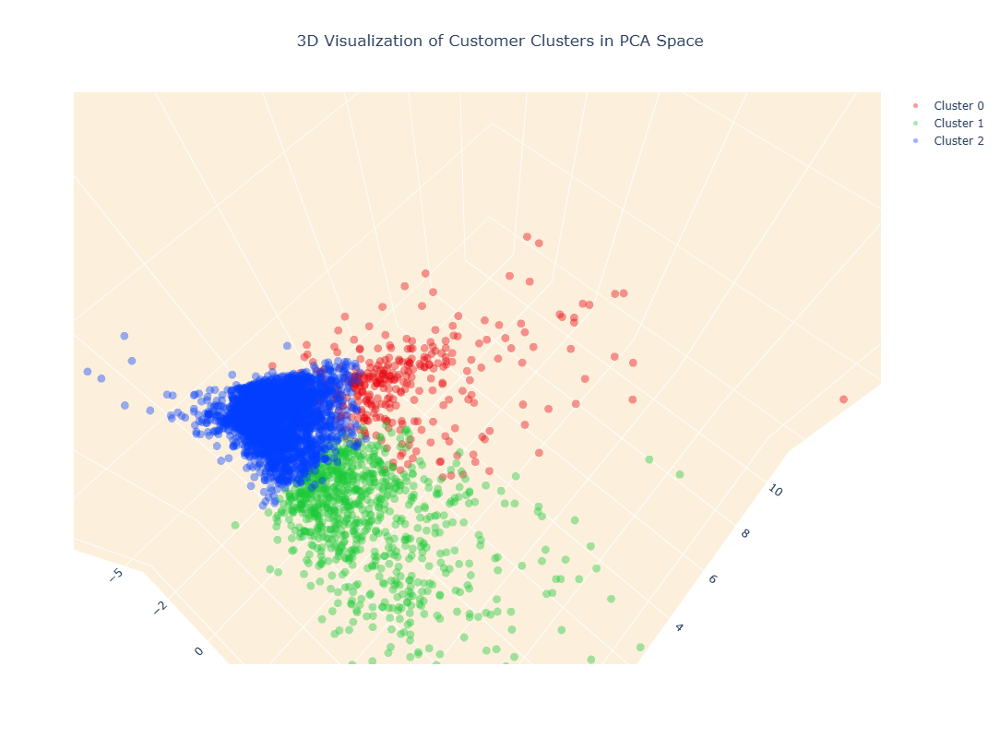

In [94]:
# Create separate data frames for each cluster
cluster_0 = customer_data_pca[customer_data_pca['cluster'] == 0]
cluster_1 = customer_data_pca[customer_data_pca['cluster'] == 1]
cluster_2 = customer_data_pca[customer_data_pca['cluster'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0['PC1'], y=cluster_0['PC2'], z=cluster_0['PC3'], 
                           mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1['PC1'], y=cluster_1['PC2'], z=cluster_1['PC3'], 
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2['PC1'], y=cluster_2['PC2'], z=cluster_2['PC3'], 
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))
# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1'),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2'),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3'),
    ),
    width=900,
    height=800
)

# Show the plot
fig.show()

Cluster Distribution Visualization

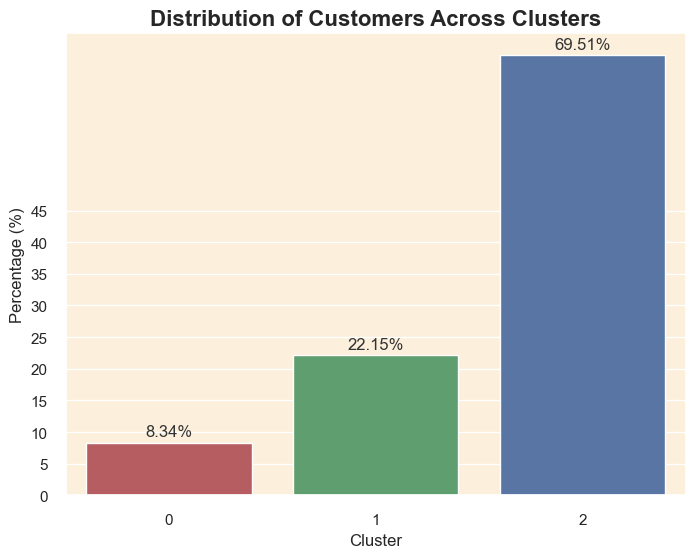

In [95]:
# Calculate the percentage of customers in each cluster
cluster_percentage = (customer_data_pca['cluster'].value_counts(normalize=True) * 100).reset_index()
cluster_percentage.columns = ['Cluster', 'Percentage']
cluster_percentage.sort_values(by='Cluster', inplace=True)

# Define a new color palette
new_colors = ['#c44e52', '#55a868', '#4c72b0']

# Create a vertical bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='Cluster', y='Percentage', data=cluster_percentage, hue='Cluster', palette=new_colors, legend=False)

# Adding percentages on top of the bars
for index, value in enumerate(cluster_percentage['Percentage']):
    plt.text(index, value + 1, f'{value:.2f}%', ha='center', fontsize=12, color='#333333')

# Customize plot appearance
plt.title('Distribution of Customers Across Clusters', fontsize=16, fontweight='bold')
plt.yticks(ticks=np.arange(0, 50, 5))
plt.ylabel('Percentage (%)')
plt.xlabel('Cluster')

# Show the plot
plt.show()


Evaluation Metrics

In [96]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate
#Compute number of customers
num_observations = len(customer_data_pca)

# Separate the features and the cluster labels
X = customer_data_pca.drop('cluster', axis=1)
clusters = customer_data_pca['cluster']

# Compute the metrics
sil_score = silhouette_score(X, clusters)
calinski_score = calinski_harabasz_score(X, clusters)
davies_score = davies_bouldin_score(X, clusters)

# Create a table to display the metrics and the number of observations
table_data = [
    ["Number of Observations", num_observations],
    ["Silhouette Score", sil_score],
    ["Calinski Harabasz Score", calinski_score],
    ["Davies Bouldin Score", davies_score]
]
# Print the table
print(tabulate(table_data, headers=["Metric", "Value"], tablefmt='pretty'))

+-------------------------+---------------------+
|         Metric          |        Value        |
+-------------------------+---------------------+
| Number of Observations  |        4067         |
|    Silhouette Score     | 0.39559644871387245 |
| Calinski Harabasz Score | 1266.9211004139331  |
|  Davies Bouldin Score   |  1.43205424839672   |
+-------------------------+---------------------+


Silhouette Score     || 0.39|

 0.39 is a moderate score. It suggests that the clustering is somewhat well-separated but there is room for improvement. It’s not perfect but not poor either, indicating meaningful but not highly distinct clusters.

Calinski Harabasz Score |  1266.6290926414076

1266.63 is a relatively high value, indicating that the clusters are well-separated in terms of dispersion. However, this metric does not have a fixed range, so comparing this score with previous runs or different configurations of your model is useful.

Davies Bouldin Score   | 1.4320427659717779
A score of 1.432 suggests that your clusters are relatively well-separated, but there's room for improvement. Typically, a score below 1 is considered very good, while values above 1 indicate that there may be some overlap between the clusters.

Cluster Analysis and Profiling


In [97]:
#Radar Chart Approach

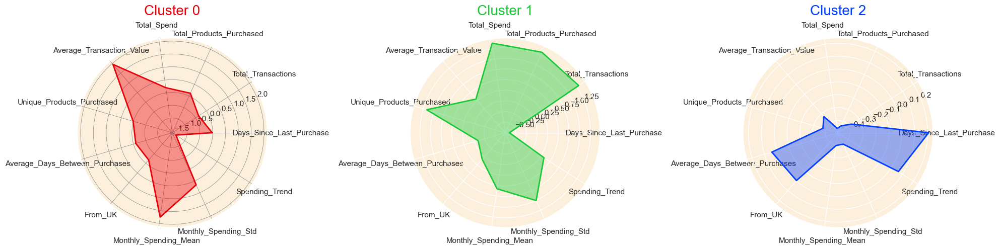

In [98]:
# Setting 'CustomerID' column as index and assigning it to a new dataframe
df_customer = customer_data_cleaned.set_index('CustomerID')

# Standardize the data (excluding the cluster column)
scaler = StandardScaler()
df_customer_standardized = scaler.fit_transform(df_customer.drop(columns=['cluster'], axis=1))

# Create a new dataframe with standardized values and add the cluster column back
df_customer_standardized = pd.DataFrame(df_customer_standardized, columns=df_customer.columns[:-1], index=df_customer.index)
df_customer_standardized['cluster'] = df_customer['cluster']

# Calculate the centroids of each cluster
cluster_centroids = df_customer_standardized.groupby('cluster').mean()
# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')
    
    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
ax[0].set_xticks(angles[:-1])
ax[0].set_xticklabels(labels[:-1])
ax[1].set_xticks(angles[:-1])
ax[1].set_xticklabels(labels[:-1])

ax[2].set_xticks(angles[:-1])
ax[2].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()


Cluster 0: High-value, frequent shoppers with brand loyalty.

Cluster 1: Low-value, infrequent shoppers with minimal engagement.

Cluster 2: Mid-value, occasional shoppers with diverse product interests.

 DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

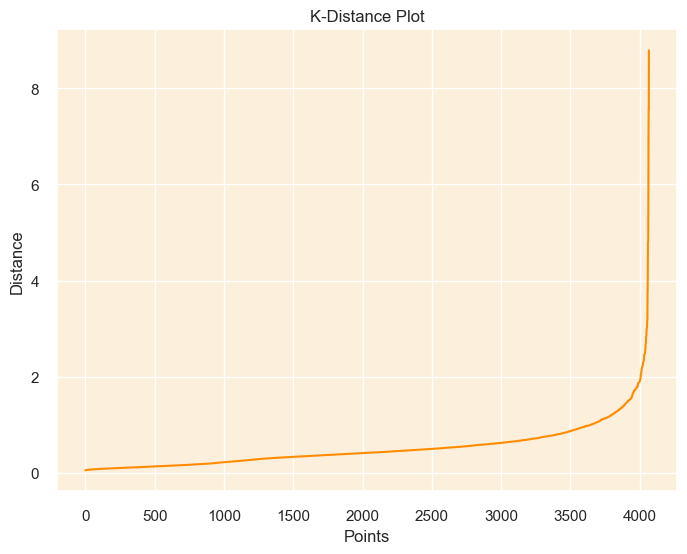

In [99]:
#plot the K-distance graph to help identify the optimal value of epsilon
from sklearn.neighbors import NearestNeighbors

# Calculate the K-distance for DBSCAN (using K=4 as an example)
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(customer_data_pca)
distances, indices = neighbors_fit.kneighbors(customer_data_pca)

# Sort the distances in ascending order to create the K-distance graph
distances = np.sort(distances[:, 3], axis=0)

# Plot the K-distance graph
plt.figure(figsize=(8, 6))
plt.plot(distances)
plt.title('K-Distance Plot')
plt.xlabel('Points')
plt.ylabel('Distance')
plt.grid(True)
plt.show()


In [100]:
#Model Execution (DBSCAN Clustering)
from sklearn.cluster import DBSCAN

# Assuming the optimal value of eps is determined from the K-distance plot
eps_value = 0.5  # Update this with the optimal value from your K-distance plot
min_samples_value = 5  # You can adjust this depending on your data

# Apply DBSCAN
dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
dbscan_labels = dbscan.fit_predict(customer_data_pca)

# Add the labels to the dataframe
customer_data_cleaned['dbscan_cluster'] = dbscan_labels


In [101]:
 #Evaluation Metrics
from sklearn.metrics import silhouette_score, adjusted_rand_score

# Exclude noise points (label = -1)
labels_dbscan = dbscan_labels[dbscan_labels != -1]
customer_data_no_noise = customer_data_cleaned[dbscan_labels != -1]

# Calculate Silhouette Score (higher is better)
silhouette = silhouette_score(customer_data_pca[dbscan_labels != -1], labels_dbscan)
print(f'Silhouette Score: {silhouette}')


Silhouette Score: -0.12210268125364851


Building a Predictivev classifier model

In [102]:
!pip install xgboost


In [103]:
# Importing necessary libraries
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure plots are shown in the notebook
%matplotlib inline


In [104]:
# Assuming your dataset with customer features and assigned cluster labels is `customer_data_cleaned`
# Here, 'cluster' is the target variable
features = [
    'Total_Spend', 'Total_Products_Purchased', 'Average_Transaction_Value', 
    'Unique_Products_Purchased', 'Total_Transactions', 'Average_Days_Between_Purchases', 
    'Days_Since_Last_Purchase', 'Spending_Trend', 'Monthly_Spending_Mean', 
    'Monthly_Spending_Std', 'From_UK'
]
target = 'cluster'

# Splitting features and target variable
X = customer_data_cleaned[features]
y = customer_data_cleaned[target]

# Checking the first few rows of X and y
print("Features Sample:")
print(X.head())
print("\nTarget Sample:")
print(y.head())


Features Sample:
   Total_Spend  Total_Products_Purchased  Average_Transaction_Value  \
0       4310.0                      2458                 615.714286   
1      1437.24                      2332                     359.31   
2        294.4                       196                      294.4   
3      1506.07                       589                  188.25875   
4         89.0                        20                       89.0   

   Unique_Products_Purchased  Total_Transactions  \
0                        103                   7   
1                         21                   4   
2                         16                   1   
3                         57                   8   
4                          4                   1   

   Average_Days_Between_Purchases  Days_Since_Last_Purchase  Spending_Trend  \
0                        2.016575                         2        4.486071   
1                       10.884615                        75        -100.884   
2     

In [105]:
#standardise the features
# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Checking the standardized features
print("Standardized Features Sample:")
print(X_scaled[:5])


Standardized Features Sample:
[[ 2.16344164  1.88603112  1.63061393  0.74215452  0.59673541 -0.1247024
  -0.8956341   0.12447329  0.93066924  1.27740642 -3.4218964 ]
 [ 0.17962957  1.75023175  0.35376694 -0.56144536 -0.04536431  0.6440772
  -0.15993563 -0.52061261 -0.01566942  0.47586383 -3.4218964 ]
 [-0.60956959 -0.55189096  0.03052688 -0.64093315 -0.68746404 -0.29952134
   2.20840873  0.09700912 -0.25523968 -0.71525048 -3.4218964 ]
 [ 0.22716079 -0.12832625 -0.49803736  0.01086679  0.81076866 -0.02795907
  -0.55298002  0.00692245  0.04784014  0.0667447  -3.4218964 ]
 [-0.75141054 -0.74157898 -0.99232799 -0.83170387 -0.68746404 -0.29952134
   1.14013425  0.09700912 -1.01333138 -0.71525048 -3.4218964 ]]


In [106]:
#split data into train and testing
# Splitting the dataset into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42, stratify=y)

print("Training Set Size:", X_train.shape)
print("Testing Set Size:", X_test.shape)


Training Set Size: (2846, 11)
Testing Set Size: (1221, 11)


In [107]:
#define classifer
# Dictionary of classifiers
classifiers = {
    "Logistic Regression": LogisticRegression(random_state=42, max_iter=200),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Support Vector Machine (RBF Kernel)": SVC(kernel='rbf', random_state=42),
    "K-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
}

print("Defined Classifiers:")
print(classifiers.keys())


Defined Classifiers:
dict_keys(['Logistic Regression', 'Random Forest', 'Support Vector Machine (RBF Kernel)', 'K-Nearest Neighbors', 'Decision Tree', 'XGBoost'])


In [108]:
# Function to train and evaluate a classifier
def train_evaluate_model(classifier, X_train, X_test, y_train, y_test):
    # Train the classifier
    classifier.fit(X_train, y_train)
    
    # Predict the labels on the test set
    y_pred = classifier.predict(X_test)
    
    # Evaluate the classifier performance
    accuracy = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred)
    
    # Print evaluation metrics
    print(f"Accuracy: {accuracy:.4f}")
    print("\nConfusion Matrix:\n", cm)
    print("\nClassification Report:\n", cr)
    
    # Visualize the Confusion Matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', 
                xticklabels=np.unique(y), yticklabels=np.unique(y))
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Cluster')
    plt.ylabel('Actual Cluster')
    plt.show()
    
    return accuracy



Evaluating Logistic Regression...
Accuracy: 0.9910

Confusion Matrix:
 [[ 96   1   5]
 [  1 268   1]
 [  1   2 846]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.94      0.96       102
           1       0.99      0.99      0.99       270
           2       0.99      1.00      0.99       849

    accuracy                           0.99      1221
   macro avg       0.99      0.98      0.98      1221
weighted avg       0.99      0.99      0.99      1221



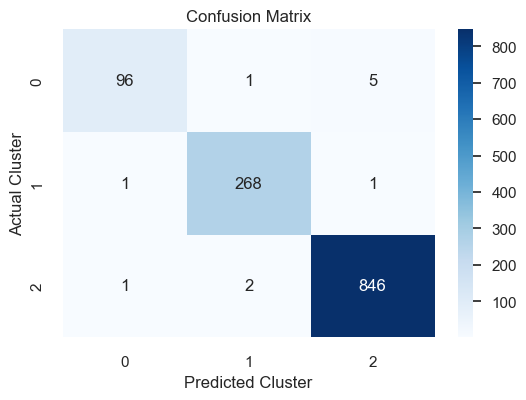


Evaluating Random Forest...
Accuracy: 0.9713

Confusion Matrix:
 [[ 89   9   4]
 [  2 257  11]
 [  1   8 840]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.87      0.92       102
           1       0.94      0.95      0.94       270
           2       0.98      0.99      0.99       849

    accuracy                           0.97      1221
   macro avg       0.96      0.94      0.95      1221
weighted avg       0.97      0.97      0.97      1221



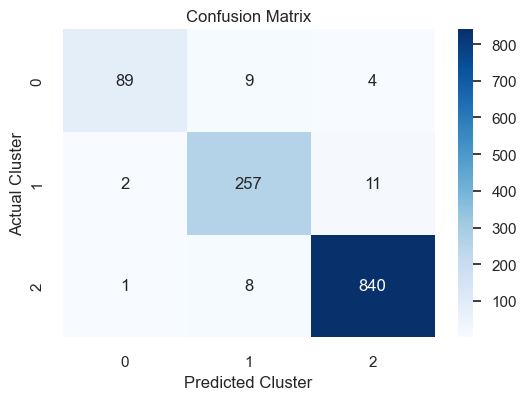


Evaluating Support Vector Machine (RBF Kernel)...
Accuracy: 0.9803

Confusion Matrix:
 [[ 92   5   5]
 [  1 264   5]
 [  2   6 841]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.90      0.93       102
           1       0.96      0.98      0.97       270
           2       0.99      0.99      0.99       849

    accuracy                           0.98      1221
   macro avg       0.97      0.96      0.96      1221
weighted avg       0.98      0.98      0.98      1221



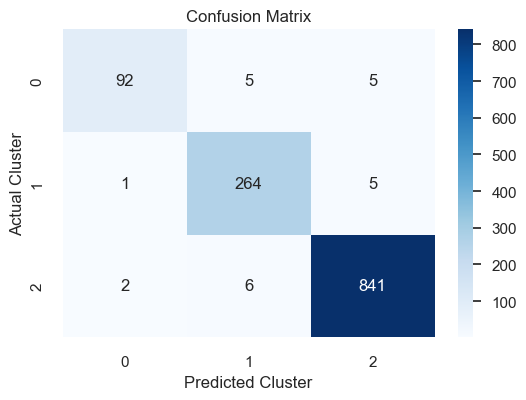


Evaluating K-Nearest Neighbors...
Accuracy: 0.9656

Confusion Matrix:
 [[ 89   6   7]
 [  3 254  13]
 [  6   7 836]]

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.87      0.89       102
           1       0.95      0.94      0.95       270
           2       0.98      0.98      0.98       849

    accuracy                           0.97      1221
   macro avg       0.95      0.93      0.94      1221
weighted avg       0.97      0.97      0.97      1221



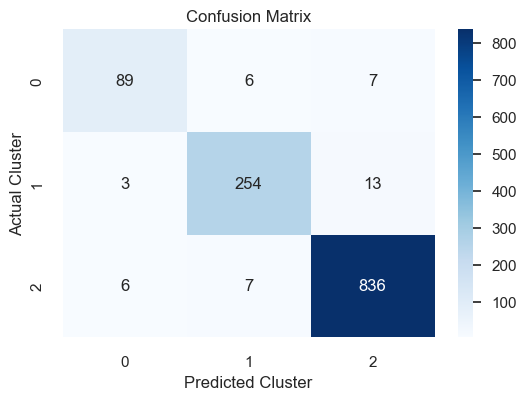


Evaluating Decision Tree...
Accuracy: 0.9468

Confusion Matrix:
 [[ 85  10   7]
 [ 11 247  12]
 [  4  21 824]]

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.83      0.84       102
           1       0.89      0.91      0.90       270
           2       0.98      0.97      0.97       849

    accuracy                           0.95      1221
   macro avg       0.91      0.91      0.91      1221
weighted avg       0.95      0.95      0.95      1221



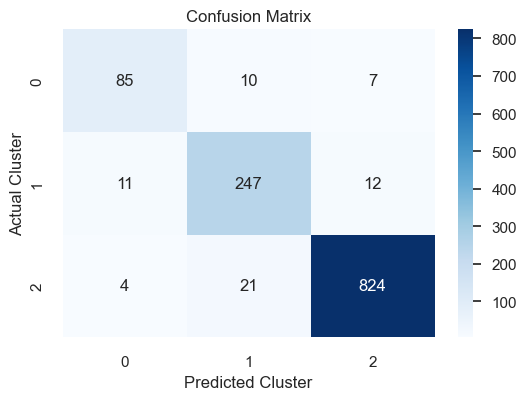


Evaluating XGBoost...


D:\Anaconda\Lib\site-packages\xgboost\core.py:158: UserWarning:

[10:11:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Accuracy: 0.9746

Confusion Matrix:
 [[ 91   6   5]
 [  3 259   8]
 [  1   8 840]]

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.92       102
           1       0.95      0.96      0.95       270
           2       0.98      0.99      0.99       849

    accuracy                           0.97      1221
   macro avg       0.96      0.95      0.95      1221
weighted avg       0.97      0.97      0.97      1221



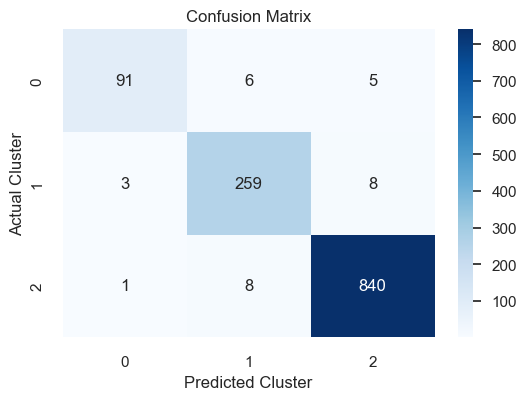

In [109]:
#evaluation
# Initialize a list to store the results
results = []

# Loop through each classifier and evaluate
for model_name, model in classifiers.items():
    print(f"\nEvaluating {model_name}...")
    accuracy = train_evaluate_model(model, X_train, X_test, y_train, y_test)
    results.append((model_name, accuracy))


In [110]:
#model accuracies
# Create a DataFrame to display the results
results_df = pd.DataFrame(results, columns=["Model", "Accuracy"])
results_df = results_df.sort_values(by="Accuracy", ascending=False)

print("\nSummary of Model Accuracies:")
print(results_df)



Summary of Model Accuracies:
                                 Model  Accuracy
0                  Logistic Regression  0.990991
2  Support Vector Machine (RBF Kernel)  0.980344
5                              XGBoost  0.974611
1                        Random Forest  0.971335
3                  K-Nearest Neighbors  0.965602
4                        Decision Tree  0.946765


C:\Users\jvenk\AppData\Local\Temp\ipykernel_24580\2752405042.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




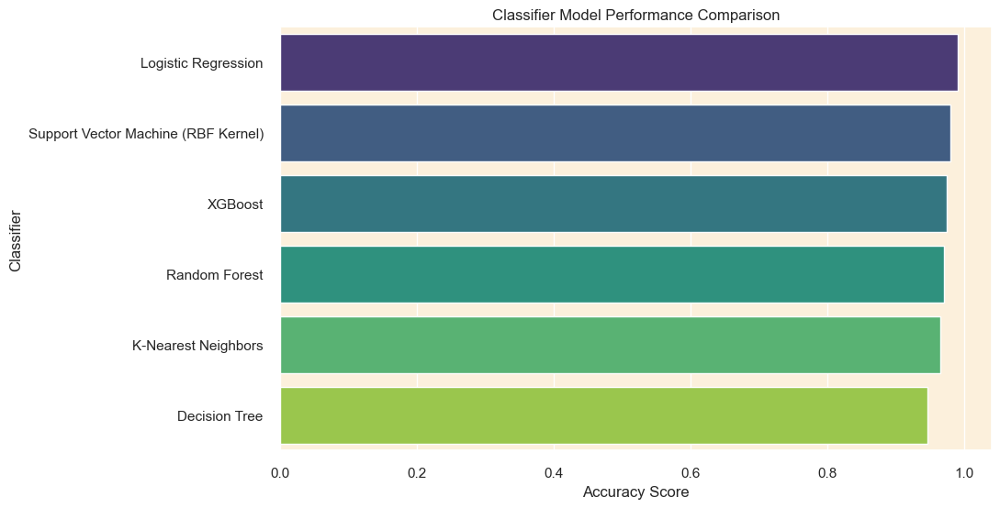

In [111]:
# Plotting the performance of each model
plt.figure(figsize=(10, 6))
sns.barplot(x="Accuracy", y="Model", data=results_df, palette="viridis")
plt.title("Classifier Model Performance Comparison")
plt.xlabel("Accuracy Score")
plt.ylabel("Classifier")
plt.show()


In [112]:
#saving the best models
import pickle

with open('kmeans.pkl', 'wb') as kmeans_file:
    pickle.dump(kmeans, kmeans_file)

# Saving the Support Vector Machine (SVM) model
with open('SVC.pkl', 'wb') as svm_file:
    pickle.dump(SVC, svm_file)

# Saving the XGBoost model
with open('XGBClassifier.pkl', 'wb') as xgb_file:
    pickle.dump(XGBClassifier, xgb_file)

print("Models saved successfully!")

Models saved successfully!
